___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___

<h1 style="text-align: center;">Deep Learning<br><br>Session - 3<br><br>Regression with ANN<br><br>KC House Data<br><h1>

# Keras Regression

In [63]:
try:
    import jupyter_black
    jupyter_black.load()
except ImportError:
    print('You can safely ignore this.')

You can safely ignore this.


In [64]:
import os

# Set tensorflow log level to ignore INFOs.
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "1"

In [65]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

plt.rcParams["figure.figsize"] = (10, 6)

sns.set_style("whitegrid")
pd.set_option("display.float_format", lambda x: "%.3f" % x)

# Uncomment the following lines if you want to suppress warnings:
# import warnings
# warnings.filterwarnings("ignore")
# warnings.warn("this will not show")

# Set it to None to display all rows in the dataframe:
# pd.set_option('display.max_rows', None)

# Set it to None to display all columns in the dataframe:
pd.set_option("display.max_columns", None)

In [66]:
# Get python version
!python --version

Python 3.9.17


In [67]:
# Get tensorflow version
import tensorflow as tf

tf.__version__

'2.11.0'

In [68]:
# List cuda-capable gpu's that are attached to this session
if tf.config.list_physical_devices("GPU"):
    print("GPU support is enabled for this session.")
else:
    print("This session will run on CPU.")

This session will run on CPU.


In [69]:
# Get more information about gpu (if available)
if tf.config.list_physical_devices("GPU"):
    !nvidia-smi

In [70]:
# !pip install folium
# !conda install folium -c conda-forge
# Conda is preferred

In [71]:
# If importing data from google drive, import drive from google.colab and mount your drive to the session
# from google.colab import drive
# drive.mount('/content/drive')

In [72]:
# Make sure the provide the correct path if drive is mounted
# df = pd.read_csv("drive/MyDrive/Colab_Files/data/kc_house_data.csv")

In [73]:
# from matplotlib import style
# style.use('dark_background')

In [74]:
df = pd.read_csv("kc_house_data.csv")

## Exploratory Data Analysis and Visualization

In [75]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650
1,6414100192,12/9/2014,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639
2,5631500400,2/25/2015,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062
3,2487200875,12/9/2014,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000
4,1954400510,2/18/2015,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503


We will be using a dataset from Kaggle:

https://www.kaggle.com/harlfoxem/housesalesprediction

**Feature Columns:**
    
1. id - Unique ID for each home sold
2. date - Date of the home sale
3. price - Price of each home sold
4. bedrooms - Number of bedrooms
5. bathrooms - Number of bathrooms, where .5 accounts for a room with a toilet but no shower
6. sqft_living - Square footage of the apartments interior living space
7. sqft_lot - Square footage of the land space
8. floors - Number of floors
9. waterfront - A dummy variable for whether the apartment was overlooking the waterfront or not
10. view - An index from 0 to 4 of how good the view of the property was
11. condition - An index from 1 to 5 on the condition of the apartment,
12. grade - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design.
13. sqft_above - The square footage of the interior housing space that is above ground level
14. sqft_basement - The square footage of the interior housing space that is below ground level
15. yr_built - The year the house was initially built
16. yr_renovated - The year of the house’s last renovation
17. zipcode - What zipcode area the house is in
18. lat - Lattitude
19. long - Longitude
20. sqft_living15 - The square footage of interior housing living space for the nearest 15 neighbors
21. sqft_lot15 - The square footage of the land lots of the nearest 15 neighbors

In [76]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     21597 non-null  int64  
 9   view           21597 non-null  int64  
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  int64  
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   21597 non-null  int64  
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [77]:
df.isnull().sum().any()

False

In [78]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,21597.000,4580474287.771,2876735715.748,1000102.000,2123049175.000,3904930410.000,7308900490.000,9900000190.000
price,21597.000,540296.574,367368.140,78000.000,322000.000,450000.000,645000.000,7700000.000
bedrooms,21597.000,3.373,0.926,1.000,3.000,3.000,4.000,33.000
bathrooms,21597.000,2.116,0.769,0.500,1.750,2.250,2.500,8.000
sqft_living,21597.000,2080.322,918.106,370.000,1430.000,1910.000,2550.000,13540.000
sqft_lot,21597.000,15099.409,41412.637,520.000,5040.000,7618.000,10685.000,1651359.000
floors,21597.000,1.494,0.540,1.000,1.000,1.500,2.000,3.500
waterfront,21597.000,0.008,0.087,0.000,0.000,0.000,0.000,1.000
view,21597.000,0.234,0.766,0.000,0.000,0.000,0.000,4.000
condition,21597.000,3.410,0.651,1.000,3.000,3.000,4.000,5.000


### id_number

In [79]:
df = df.drop("id", axis=1)

### price

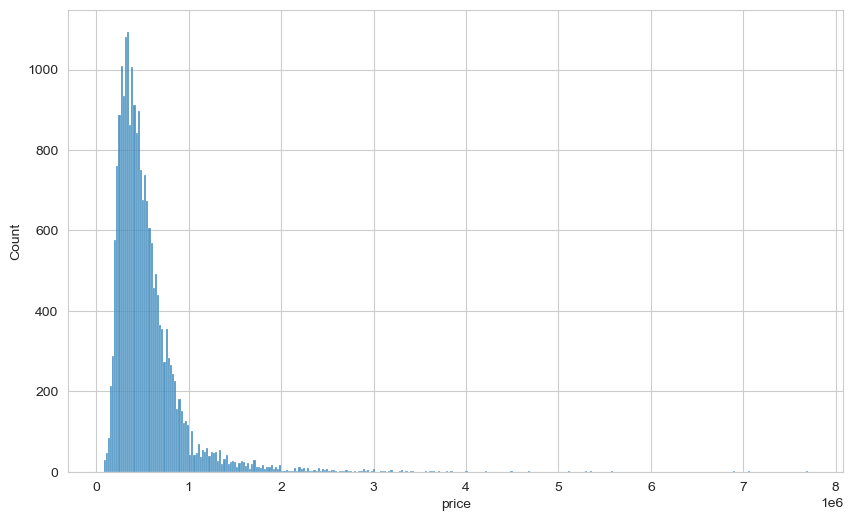

In [80]:
sns.histplot(x=df["price"])
plt.show()

In [81]:
df[df["price"] > 3000000].sort_values(by="price", ascending=False)

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
7245,10/13/2014,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,98102,47.630,-122.323,3940,8800
3910,6/11/2014,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,1940,2001,98004,47.650,-122.214,3930,25449
9245,9/19/2014,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,2001,0,98039,47.630,-122.240,4540,42730
4407,8/4/2014,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,2001,0,98039,47.629,-122.233,3560,24345
1446,4/13/2015,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,2009,0,98004,47.623,-122.220,4600,21750
1313,4/13/2015,5300000.000,6,6.000,7390,24829,2.000,1,4,4,12,5000,2390,1991,0,98040,47.563,-122.210,4320,24619
1162,10/20/2014,5110000.000,5,5.250,8010,45517,2.000,1,4,3,12,5990,2020,1999,0,98033,47.677,-122.211,3430,26788
8085,6/17/2014,4670000.000,5,6.750,9640,13068,1.000,1,4,3,12,4820,4820,1983,2009,98040,47.557,-122.210,3270,10454
2624,8/15/2014,4500000.000,5,5.500,6640,40014,2.000,1,4,3,12,6350,290,2004,0,98155,47.749,-122.280,3030,23408
8629,6/18/2014,4490000.000,4,3.000,6430,27517,2.000,0,0,3,12,6430,0,2001,0,98004,47.621,-122.219,3720,14592


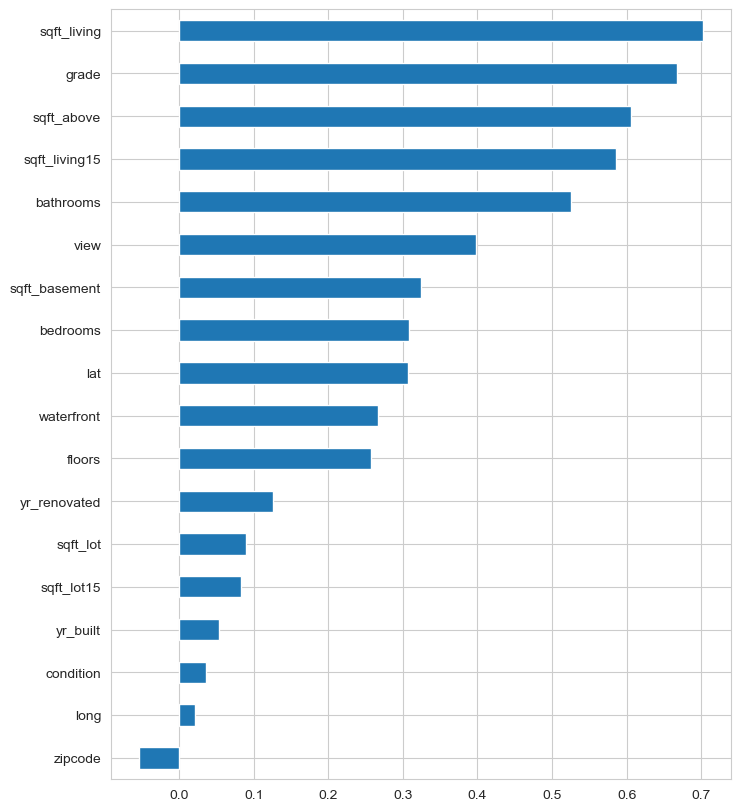

In [82]:
plt.figure(figsize=(8, 10))
(df.corr(numeric_only=True)["price"].sort_values().drop("price").plot(kind="barh"))
plt.show()

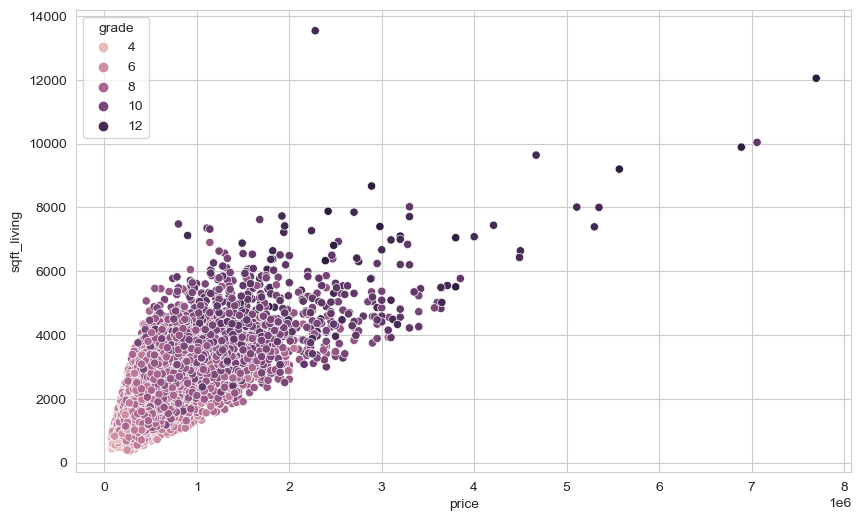

In [83]:
sns.scatterplot(x="price", y="sqft_living", data=df, hue="grade")
plt.show()

### bedrooms

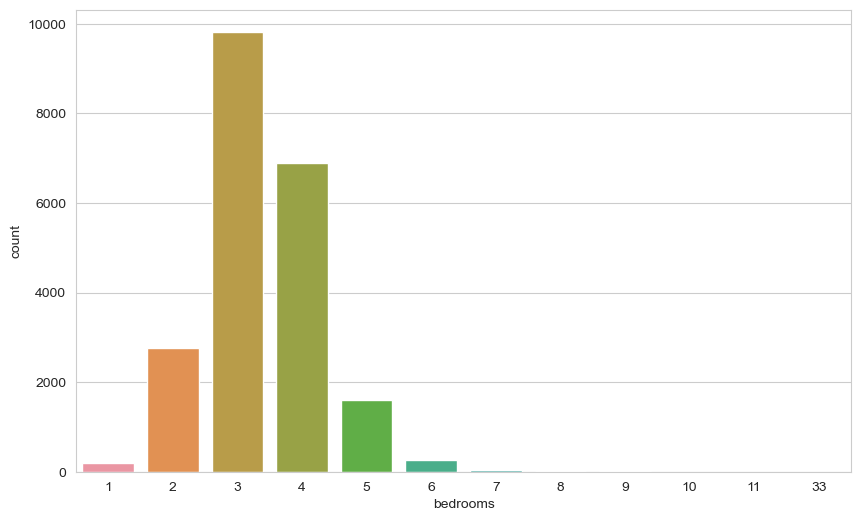

In [84]:
sns.countplot(x=df["bedrooms"])
plt.show()

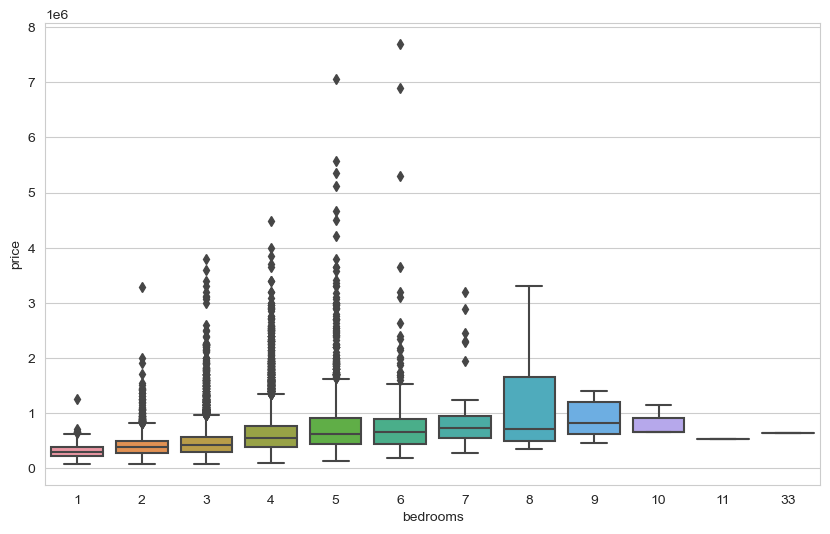

In [85]:
sns.boxplot(x="bedrooms", y="price", data=df)
plt.show()

In [86]:
df[df["bedrooms"] > 10]

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
8748,8/21/2014,520000.000,11,3.000,3000,4960,2.000,0,0,3,7,2400,600,1918,1999,98106,47.556,-122.363,1420,4960
15856,6/25/2014,640000.000,33,1.750,1620,6000,1.000,0,0,5,7,1040,580,1947,0,98103,47.688,-122.331,1330,4700


In [87]:
df = df[df["bedrooms"] != 33]

Most likely the data was entered incorrectly.

In [88]:
df.shape

(21596, 20)

### date

In [89]:
df["date"].dtype

dtype('O')

In [90]:
df["date"] = pd.to_datetime(df["date"])

In [91]:
df["date"]

0       2014-10-13
1       2014-12-09
2       2015-02-25
3       2014-12-09
4       2015-02-18
           ...    
21592   2014-05-21
21593   2015-02-23
21594   2014-06-23
21595   2015-01-16
21596   2014-10-15
Name: date, Length: 21596, dtype: datetime64[ns]

In [92]:
df["year"] = df["date"].dt.year
# df['year'] = df['date'].apply(lambda date: date.year)
# Avoid using the apply method as it is almost 14x slower.

In [93]:
%%timeit
df["date"].dt.year

2.62 ms ± 83 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [94]:
%%timeit
df["date"].apply(lambda date: date.year)

28.1 ms ± 1.9 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [95]:
df["month"] = df["date"].dt.month

In [96]:
df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month
0,2014-10-13,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650,2014,10
1,2014-12-09,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639,2014,12
2,2015-02-25,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062,2015,2
3,2014-12-09,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000,2014,12
4,2015-02-18,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503,2015,2


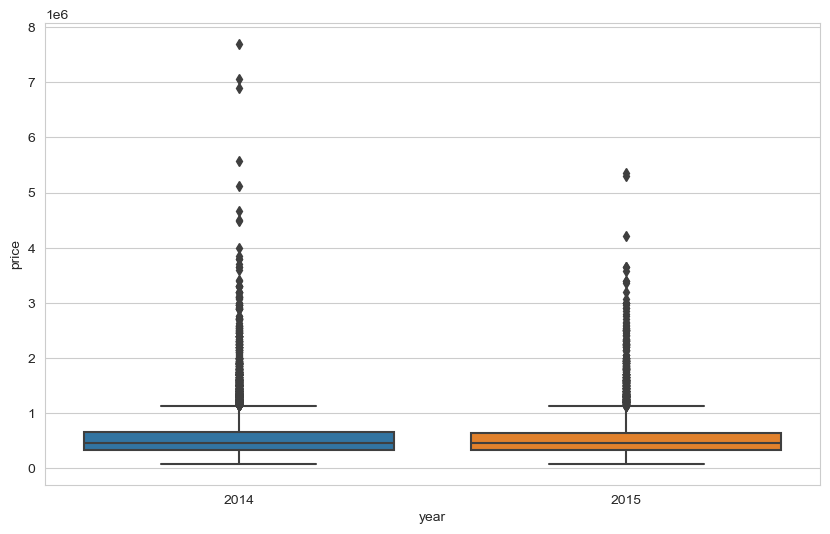

In [97]:
sns.boxplot(x="year", y="price", data=df)
plt.show()

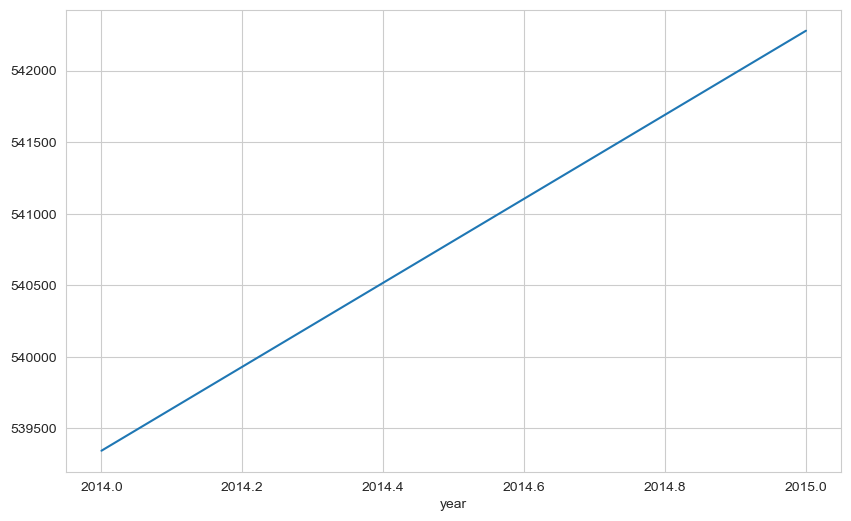

In [98]:
df.groupby("year")["price"].mean().plot()
plt.show()

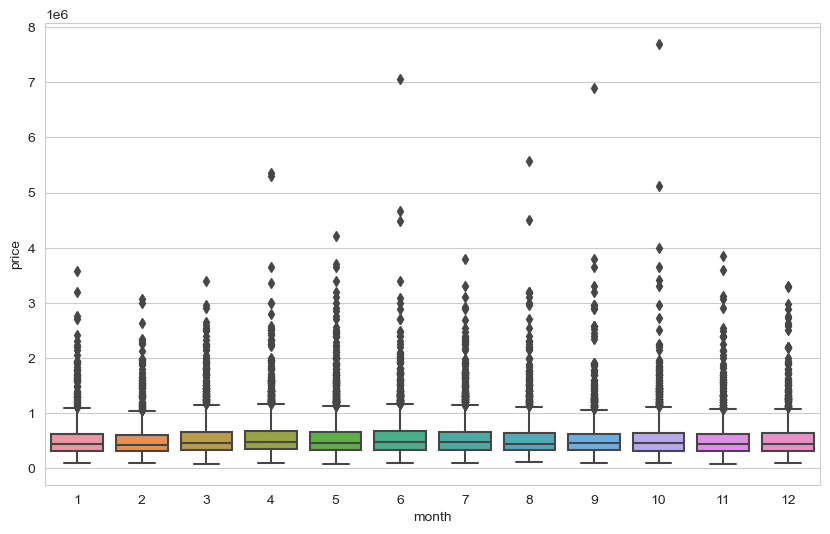

In [99]:
sns.boxplot(x="month", y="price", data=df)
plt.show()

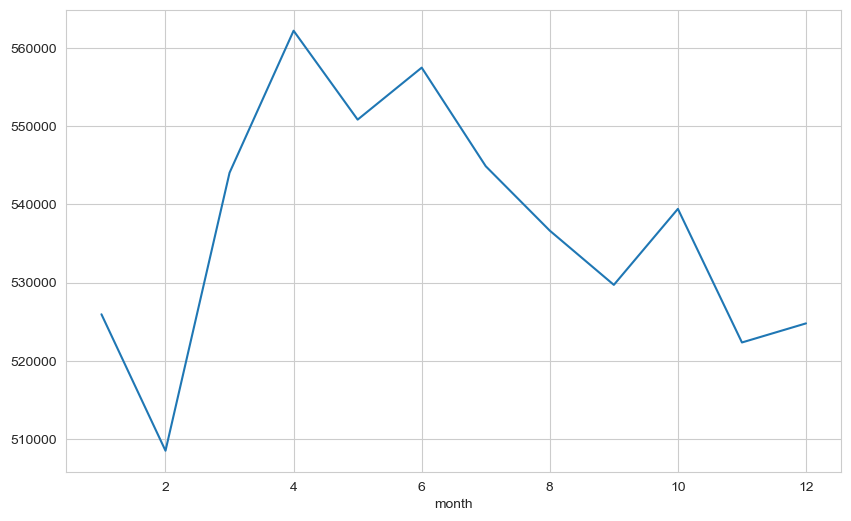

In [100]:
df.groupby("month")["price"].mean().plot()
plt.show()

In [101]:
df = df.drop(["date", "year", "month"], axis=1)

### zipcode

In [102]:
df["zipcode"].value_counts(dropna=False)

98103    601
98038    589
98115    583
98052    574
98117    553
        ... 
98102    104
98010    100
98024     80
98148     57
98039     50
Name: zipcode, Length: 70, dtype: int64

If you want to keep zipcodes, look into [hash encoding](https://medium.com/flutter-community/dealing-with-categorical-features-with-high-cardinality-feature-hashing-7c406ff867cb).

In [103]:
df = df.drop("zipcode", axis=1)

### yr_renovated & yr_built

In [104]:
df["yr_renovated"].value_counts(dropna=False)

0       20682
2014       91
2013       37
2003       36
2005       35
        ...  
1951        1
1959        1
1948        1
1954        1
1944        1
Name: yr_renovated, Length: 70, dtype: int64

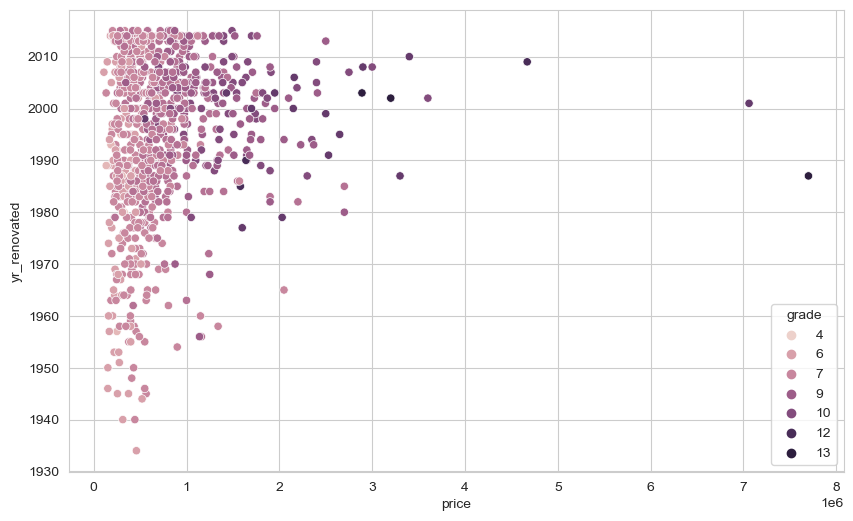

In [105]:
sns.scatterplot(x="price", y="yr_renovated", data=df[df.yr_renovated != 0], hue="grade")
plt.show()

In [106]:
df["yr_built"].value_counts(dropna=False)

2014    559
2006    453
2005    450
2004    433
2003    420
       ... 
1933     30
1901     29
1902     27
1935     24
1934     21
Name: yr_built, Length: 116, dtype: int64

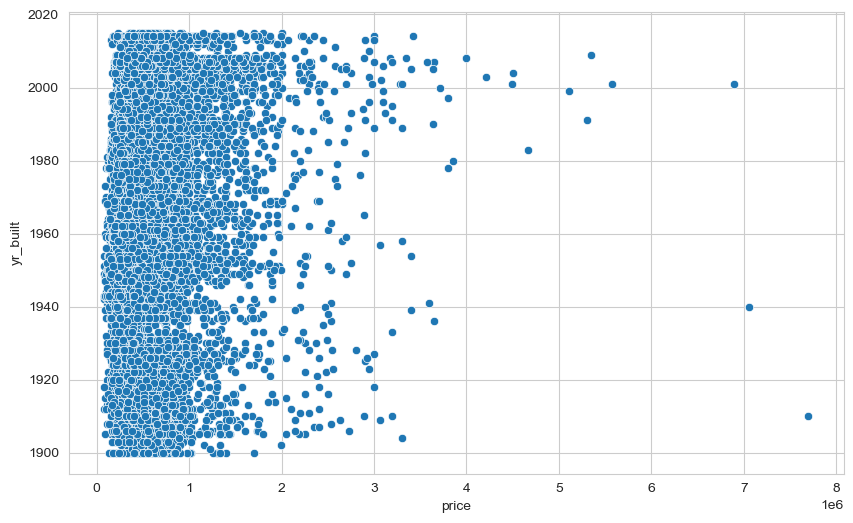

In [107]:
sns.scatterplot(x="price", y="yr_built", data=df)
plt.show()

In [108]:
df.yr_renovated.apply(lambda x: x if x == 0 else 1).value_counts()

0    20682
1      914
Name: yr_renovated, dtype: int64

In [109]:
df["renovated"] = df.yr_renovated.apply(lambda x: x if x == 0 else 1)

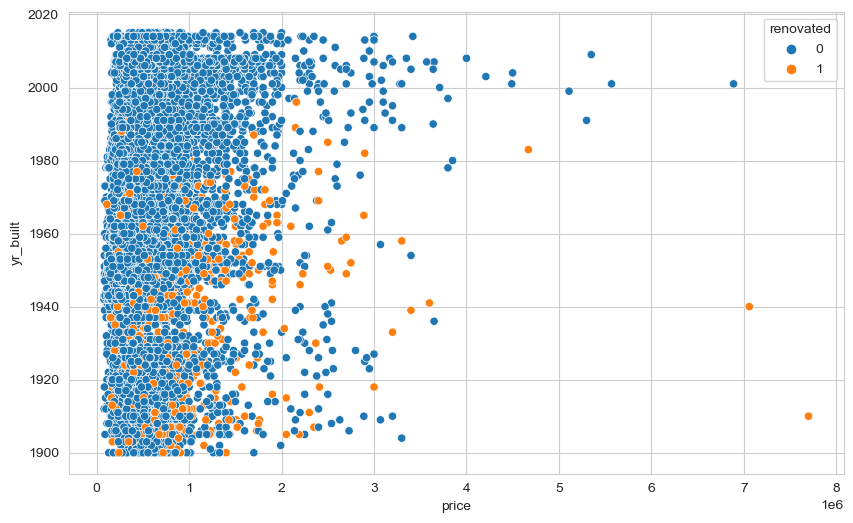

In [110]:
sns.scatterplot(x="price", y="yr_built", data=df, hue="renovated")
plt.show()

In [111]:
df["built|renovated"] = df["yr_renovated"].replace(0, np.nan).fillna(df["yr_built"])
df["built|renovated"]

0       1955.000
1       1991.000
2       1933.000
3       1965.000
4       1987.000
          ...   
21592   2009.000
21593   2014.000
21594   2009.000
21595   2004.000
21596   2008.000
Name: built|renovated, Length: 21596, dtype: float64

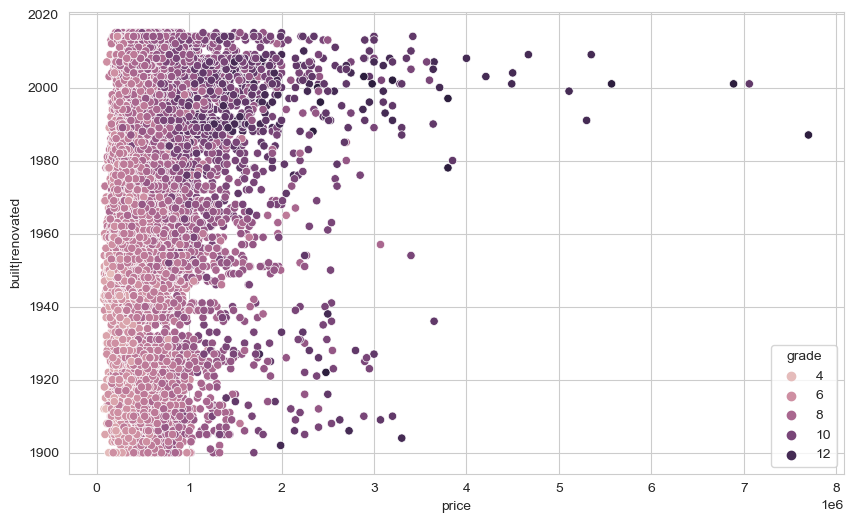

In [112]:
sns.scatterplot(x="price", y="built|renovated", data=df, hue="grade")
plt.show()

In [113]:
df.drop(["yr_renovated", "yr_built", "renovated"], axis=1, inplace=True)

### sqft_basement

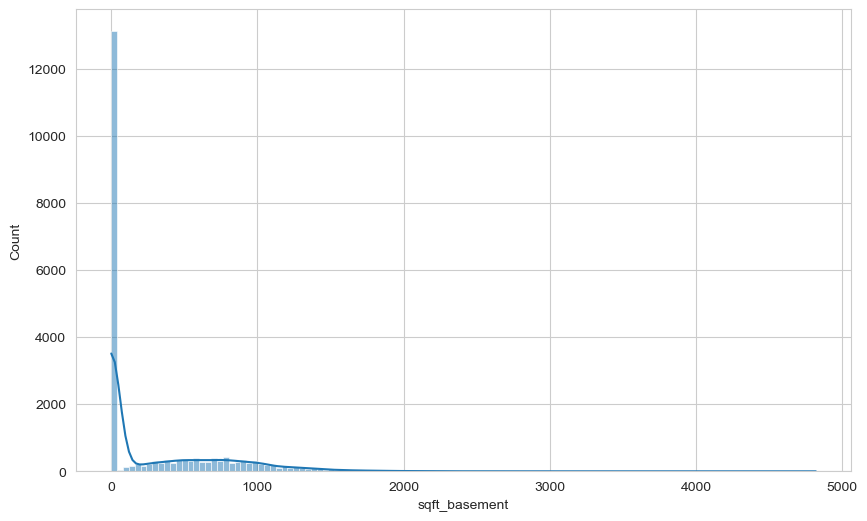

In [114]:
sns.histplot(df["sqft_basement"], kde=True)
plt.show()

In [115]:
df[df["sqft_basement"] > 3000].sort_values(by="sqft_basement", ascending=False)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
8085,4670000.000,5,6.750,9640,13068,1.000,1,4,3,12,4820,4820,47.557,-122.210,3270,10454,2009.000
12764,2280000.000,7,8.000,13540,307752,3.000,0,4,3,12,9410,4130,47.667,-121.986,4850,217800,1999.000
15468,3200000.000,4,3.250,7000,28206,1.000,1,4,4,12,3500,3500,47.593,-122.086,4913,14663,1991.000
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,47.630,-122.323,3940,8800,1987.000
10074,1900000.000,5,4.250,6510,16471,2.000,0,3,4,11,3250,3260,47.576,-122.242,4480,16471,1980.000


### sqft_above

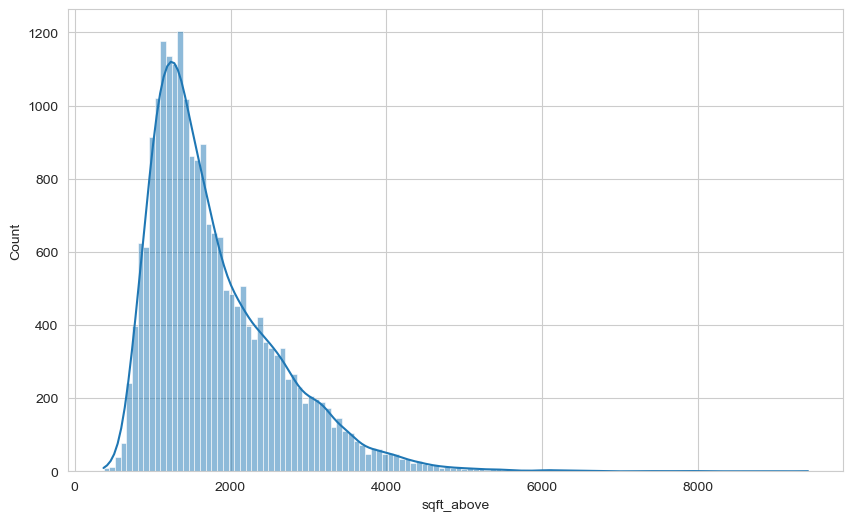

In [116]:
sns.histplot(df["sqft_above"], kde=True)
plt.show()

In [117]:
df[df["sqft_above"] > 6000].sort_values(by="sqft_above", ascending=False)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
12764,2280000.000,7,8.000,13540,307752,3.000,0,4,3,12,9410,4130,47.667,-121.986,4850,217800,1999.000
9245,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,47.630,-122.240,4540,42730,2001.000
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,47.630,-122.323,3940,8800,1987.000
18288,3300000.000,5,6.250,8020,21738,2.000,0,0,3,11,8020,0,47.568,-122.189,4160,18969,2001.000
13398,2420000.000,5,4.750,7880,24250,2.000,0,2,3,13,7880,0,47.733,-122.362,2740,10761,1996.000
19842,2700000.000,4,4.000,7850,89651,2.000,0,0,3,12,7850,0,47.541,-121.982,6210,95832,2006.000
3910,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,47.650,-122.214,3930,25449,2001.000
11859,1950000.000,4,3.250,7420,167869,2.000,0,3,3,12,7420,0,47.455,-121.764,5610,169549,2002.000
18579,1140000.000,5,4.000,7320,217800,2.000,0,0,3,11,7320,0,47.447,-122.086,3270,34500,1992.000
1446,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,47.623,-122.220,4600,21750,2009.000


### Geographical Properties

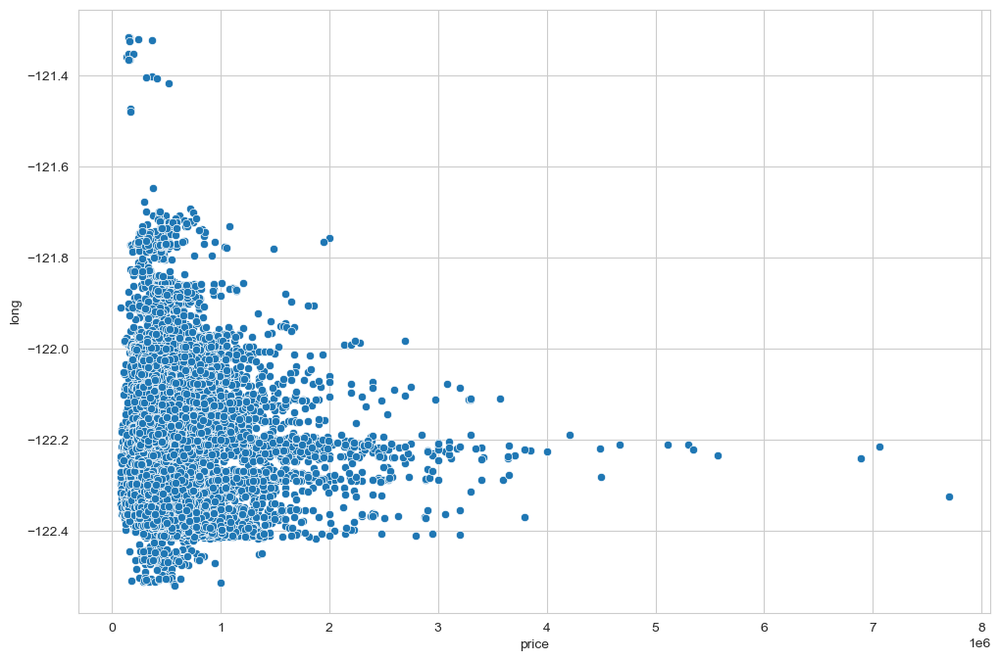

In [118]:
plt.figure(figsize=(12, 8))
sns.scatterplot(x="price", y="long", data=df)
plt.show()

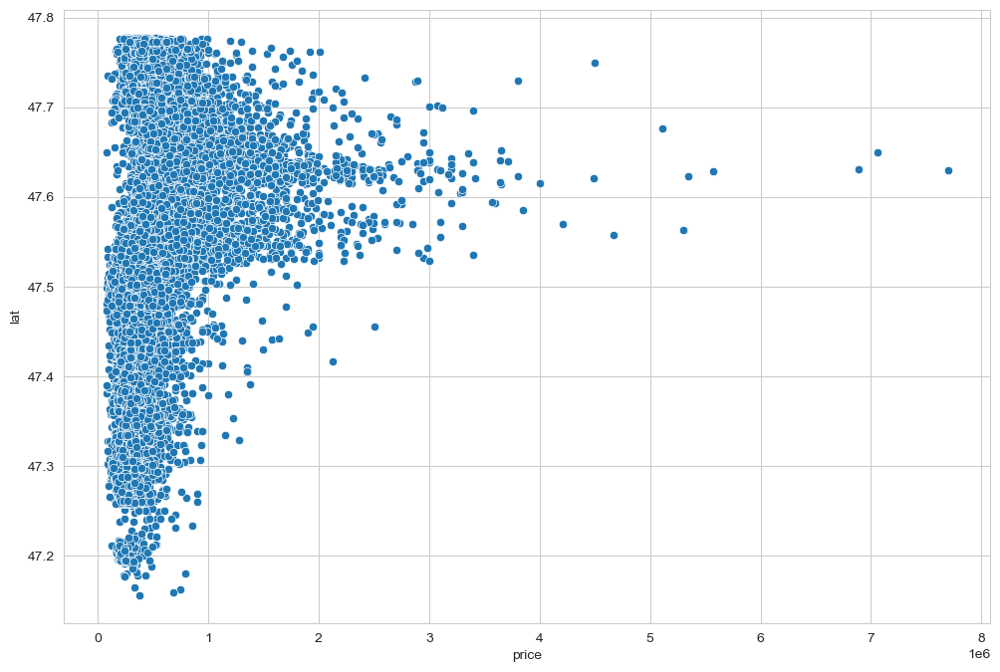

In [119]:
plt.figure(figsize=(12, 8))
sns.scatterplot(x="price", y="lat", data=df)
plt.show()

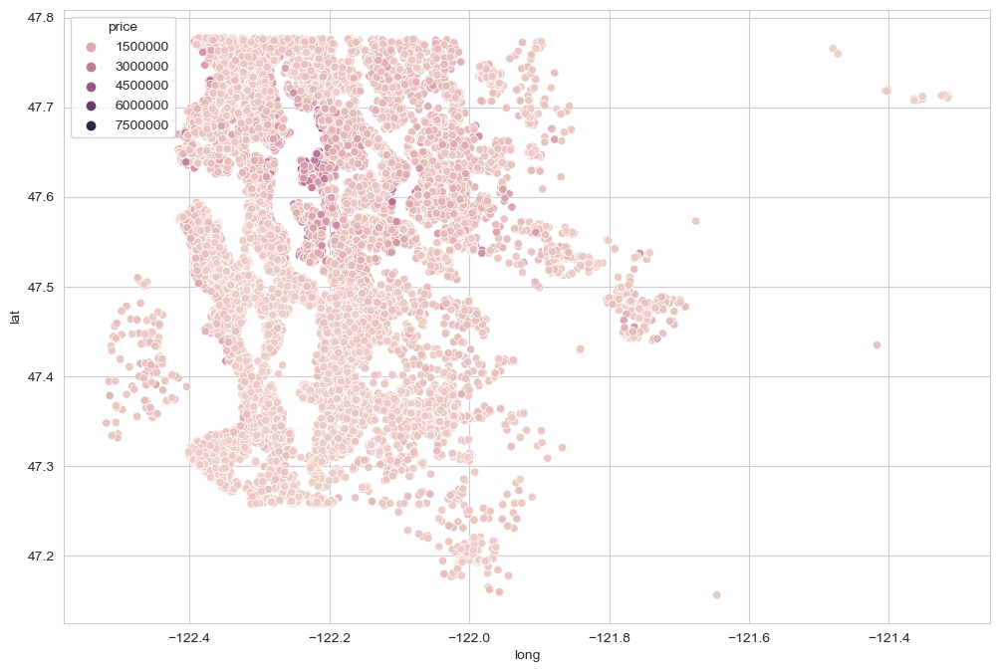

In [120]:
plt.figure(figsize=(12, 8))
sns.scatterplot(x="long", y="lat", data=df, hue="price")
plt.show()

In [121]:
# We will exclude the top 1% of most expensive houses from our visualisation.
len(df) * (0.01)

215.96

In [122]:
df.sort_values("price", ascending=False).head(216)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,47.630,-122.323,3940,8800,1987.000
3910,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,47.650,-122.214,3930,25449,2001.000
9245,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,47.630,-122.240,4540,42730,2001.000
4407,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,47.629,-122.233,3560,24345,2001.000
1446,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,47.623,-122.220,4600,21750,2009.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7408,1980000.000,6,4.500,4800,9097,2.000,0,0,3,10,3580,1220,47.626,-122.291,2180,6037,2007.000
16511,1980000.000,4,3.500,4500,44384,1.000,0,0,3,12,3340,1160,47.632,-122.192,2540,26287,1990.000
19513,1980000.000,4,4.000,4360,12081,2.000,0,0,3,10,4360,0,47.638,-122.219,2180,10800,2007.000
3278,1970000.000,5,3.750,3940,13738,1.500,0,3,4,9,3940,0,47.620,-122.212,2370,13320,1951.000


In [123]:
non_top_1_perc = df.sort_values("price", ascending=False).iloc[216:]

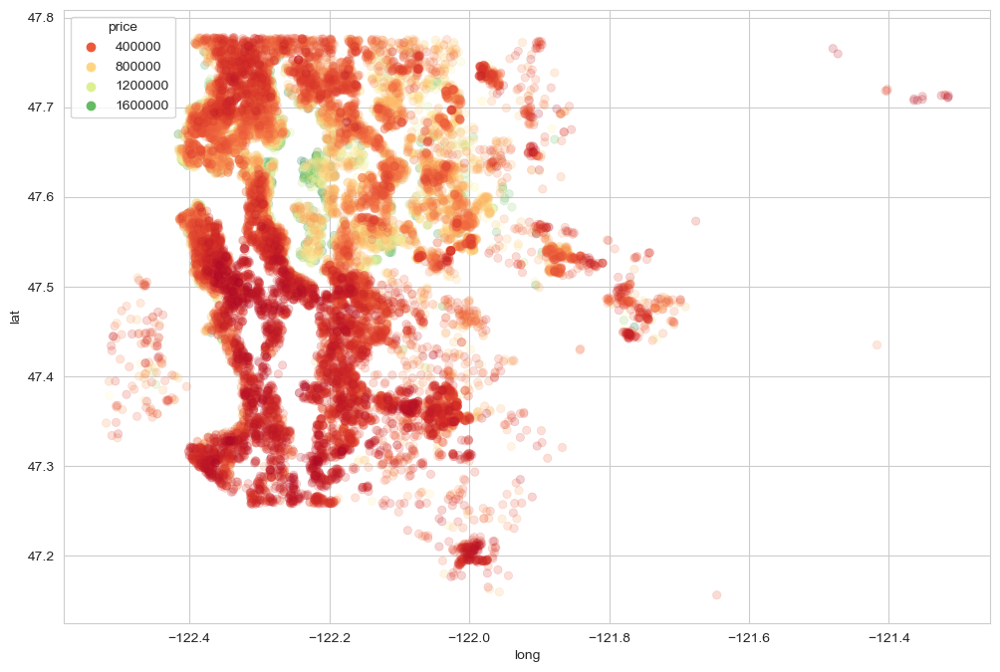

In [124]:
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x="long",
    y="lat",
    data=non_top_1_perc,
    hue="price",
    palette="RdYlGn",
    edgecolor=None,
    alpha=0.2,
)
plt.show()

In [125]:
import folium
import branca.colormap as cm

In [126]:
# The default location for our map is the mean valus of the "lat" and "long" values.
folium.Map(location=[df["lat"].mean(), df["long"].mean()], zoom_start=10)

In [127]:
# Creating bins for price ranges to derive colours off of.
step_1 = df.price.min()
step_2 = df.price.quantile(0.25)
step_3 = df.price.quantile(0.50)
step_4 = df.price.quantile(0.75)
step_5 = df.price.max()

In [128]:
m = folium.Map(location=[df["lat"].mean(), df["long"].mean()], zoom_start=10)
colormap = cm.StepColormap(
    colors=["red", "orange", "yellow", "green"],
    index=[step_1, step_2, step_3, step_4, step_5],
    vmin=step_1,
    vmax=step_5,
)
for loc, p in zip(zip(df["lat"], df["long"]), df["price"]):
    folium.Circle(location=loc, radius=1, fill=True, color=colormap(p)).add_to(m)
m

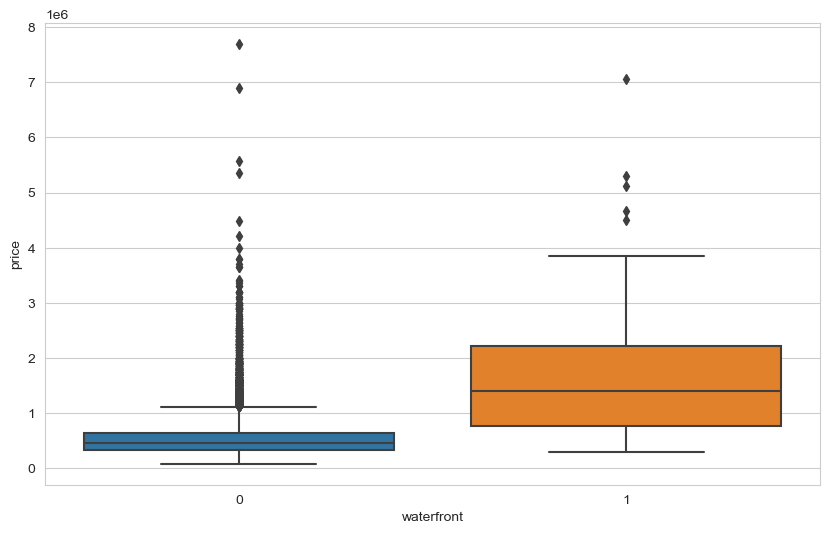

In [129]:
sns.boxplot(x="waterfront", y="price", data=df)
plt.show()

In [130]:
df.groupby("waterfront").price.mean()

waterfront
0    531757.274
1   1662524.184
Name: price, dtype: float64

### latest data

In [131]:
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
0,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,47.511,-122.257,1340,5650,1955.000
1,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,47.721,-122.319,1690,7639,1991.000
2,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,47.738,-122.233,2720,8062,1933.000
3,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,47.521,-122.393,1360,5000,1965.000
4,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,47.617,-122.045,1800,7503,1987.000


In [132]:
df.shape

(21596, 17)

## Preprocessing of Data
- Train | Test Split, Scalling

In [133]:
from sklearn.model_selection import train_test_split

In [134]:
X = df.drop("price", axis=1)
y = df["price"]

In [135]:
seed = 101

In [136]:
X_train, X_test, y_train, y_test = train_test_split(
                                                    X, 
                                                    y, 
                                                    test_size=0.1, 
                                                    random_state=seed
                                                    )

In [137]:
from sklearn.preprocessing import MinMaxScaler  # RobustScaler()

# If there are too many outliers in the data, robust scaler should be used, otherwise minmax can be used.

In [138]:
scaler = MinMaxScaler()

In [139]:
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

## Modelling & Model Performance

In [140]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation

In [141]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [142]:
def eval_metric(actual, pred):
    """Prints regression metrics, calculated using the given
    actual and predicted target values.
    Args:
        actual (list): Actual target values.
        pred (list): Predicted target values.
    Returns:
        None
    """
    mae = mean_absolute_error(actual, pred)
    mse = mean_squared_error(actual, pred)
    rmse = np.sqrt(mean_squared_error(actual, pred))
    score = r2_score(actual, pred)
    print("r2_score:", score, "\nmae:", mae, "\nmse:", mse, "\nrmse:", rmse)

In [143]:
X_train.shape

(19436, 16)

In [144]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(24, activation="relu", input_dim=X_train.shape[1]))
# model.add(Activation("relu"))
# Activation function can be added separately
# as a different line after each layer.
model.add(Dense(24, activation="relu"))
model.add(Dense(12, activation="relu"))
model.add(Dense(6, activation="relu"))
model.add(Dense(1))

model.compile(optimizer="adam", loss="mse")

In [145]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 24)                408       
                                                                 
 dense_1 (Dense)             (None, 24)                600       
                                                                 
 dense_2 (Dense)             (None, 12)                300       
                                                                 
 dense_3 (Dense)             (None, 6)                 78        
                                                                 
 dense_4 (Dense)             (None, 1)                 7         
                                                                 
Total params: 1,393
Trainable params: 1,393
Non-trainable params: 0
_________________________________________________________________


In [146]:
model.weights

[<tf.Variable 'dense/kernel:0' shape=(16, 24) dtype=float32, numpy=
 array([[ 8.15701783e-02, -6.96391165e-02,  3.34828675e-01,
          1.73008323e-01,  3.37108314e-01, -1.63834721e-01,
          2.29696155e-01, -2.63850987e-01,  5.63454330e-02,
          3.00872147e-01,  3.20549786e-01, -1.20147616e-01,
          3.36041152e-01,  1.78197026e-03,  1.58214509e-01,
         -2.04057276e-01, -6.01471066e-02, -1.82497740e-01,
          7.10851550e-02, -3.14149559e-02, -2.21511677e-01,
          8.85390937e-02, -1.73715100e-01,  2.63180971e-01],
        [-3.36665481e-01, -3.17496985e-01, -2.13649914e-01,
          2.19744742e-01,  1.62283897e-01,  1.92317545e-01,
          1.44187748e-01,  9.44396555e-02,  5.21788895e-02,
         -1.87943280e-02, -2.42998242e-01, -2.46430129e-01,
         -2.45400086e-01, -3.21694344e-01, -2.29186535e-01,
         -3.51396054e-01, -2.71645069e-01,  1.94619358e-01,
         -2.71138042e-01, -3.80968153e-02,  5.50380945e-02,
          5.84537089e-02,  3.68

In [147]:
model.fit(x=X_train, y=y_train, validation_split=0.15, batch_size=128, epochs=1000)

Epoch 1/1000
130/130 [==============================] - 22s 89ms/step - loss: 428609503232.0000 - val_loss: 423975059456.0000
Epoch 2/1000
130/130 [==============================] - 8s 63ms/step - loss: 427827101696.0000 - val_loss: 421270880256.0000
Epoch 3/1000
130/130 [==============================] - 7s 55ms/step - loss: 417207779328.0000 - val_loss: 397476134912.0000
Epoch 4/1000
130/130 [==============================] - 5s 39ms/step - loss: 365613645824.0000 - val_loss: 312036720640.0000
Epoch 5/1000
130/130 [==============================] - 3s 20ms/step - loss: 243279773696.0000 - val_loss: 170673176576.0000
Epoch 6/1000
130/130 [==============================] - 3s 23ms/step - loss: 124547956736.0000 - val_loss: 104233893888.0000
Epoch 7/1000
130/130 [==============================] - 3s 24ms/step - loss: 94522269696.0000 - val_loss: 99765239808.0000
Epoch 8/1000
130/130 [==============================] - 3s 23ms/step - loss: 91989721088.0000 - val_loss: 98272600064.0000
Epo

130/130 [==============================] - 3s 25ms/step - loss: 40880676864.0000 - val_loss: 46523990016.0000
Epoch 68/1000
130/130 [==============================] - 3s 23ms/step - loss: 40658870272.0000 - val_loss: 46327611392.0000
Epoch 69/1000
130/130 [==============================] - 3s 20ms/step - loss: 40488472576.0000 - val_loss: 46100111360.0000
Epoch 70/1000
130/130 [==============================] - 3s 21ms/step - loss: 40289120256.0000 - val_loss: 45877714944.0000
Epoch 71/1000
130/130 [==============================] - 3s 24ms/step - loss: 40131043328.0000 - val_loss: 45774524416.0000
Epoch 72/1000
130/130 [==============================] - 3s 21ms/step - loss: 39905742848.0000 - val_loss: 45382729728.0000
Epoch 73/1000
130/130 [==============================] - 3s 22ms/step - loss: 39707168768.0000 - val_loss: 45175963648.0000
Epoch 74/1000
130/130 [==============================] - 3s 23ms/step - loss: 39529082880.0000 - val_loss: 44966739968.0000
Epoch 75/1000
130/130 

Epoch 133/1000
130/130 [==============================] - 4s 28ms/step - loss: 34951163904.0000 - val_loss: 39248707584.0000
Epoch 134/1000
130/130 [==============================] - 4s 29ms/step - loss: 34962259968.0000 - val_loss: 39103209472.0000
Epoch 135/1000
130/130 [==============================] - 4s 27ms/step - loss: 34869174272.0000 - val_loss: 39074701312.0000
Epoch 136/1000
130/130 [==============================] - 3s 21ms/step - loss: 34808541184.0000 - val_loss: 38949875712.0000
Epoch 137/1000
130/130 [==============================] - 3s 23ms/step - loss: 34795425792.0000 - val_loss: 38956216320.0000
Epoch 138/1000
130/130 [==============================] - 3s 23ms/step - loss: 34745454592.0000 - val_loss: 39047622656.0000
Epoch 139/1000
130/130 [==============================] - 3s 23ms/step - loss: 34731700224.0000 - val_loss: 38853988352.0000
Epoch 140/1000
130/130 [==============================] - 3s 22ms/step - loss: 34675785728.0000 - val_loss: 38823489536.0000


130/130 [==============================] - 3s 24ms/step - loss: 32285458432.0000 - val_loss: 35271413760.0000
Epoch 264/1000
130/130 [==============================] - 4s 30ms/step - loss: 32256720896.0000 - val_loss: 35264335872.0000
Epoch 265/1000
130/130 [==============================] - 3s 21ms/step - loss: 32222300160.0000 - val_loss: 35133333504.0000
Epoch 266/1000
130/130 [==============================] - 2s 19ms/step - loss: 32217681920.0000 - val_loss: 35137650688.0000
Epoch 267/1000
130/130 [==============================] - 3s 20ms/step - loss: 32230899712.0000 - val_loss: 35194449920.0000
Epoch 268/1000
130/130 [==============================] - 3s 22ms/step - loss: 32198541312.0000 - val_loss: 34956013568.0000
Epoch 269/1000
130/130 [==============================] - 3s 24ms/step - loss: 32177582080.0000 - val_loss: 35307261952.0000
Epoch 270/1000
130/130 [==============================] - 3s 21ms/step - loss: 32199432192.0000 - val_loss: 35201105920.0000
Epoch 271/1000


130/130 [==============================] - 4s 29ms/step - loss: 30954108928.0000 - val_loss: 33375057920.0000
Epoch 394/1000
130/130 [==============================] - 3s 20ms/step - loss: 30880782336.0000 - val_loss: 33535328256.0000
Epoch 395/1000
130/130 [==============================] - 2s 18ms/step - loss: 30897090560.0000 - val_loss: 33376485376.0000
Epoch 396/1000
130/130 [==============================] - 2s 19ms/step - loss: 30886367232.0000 - val_loss: 33291249664.0000
Epoch 397/1000
130/130 [==============================] - 3s 20ms/step - loss: 30857312256.0000 - val_loss: 33433229312.0000
Epoch 398/1000
130/130 [==============================] - 2s 18ms/step - loss: 30871947264.0000 - val_loss: 33380999168.0000
Epoch 399/1000
130/130 [==============================] - 3s 20ms/step - loss: 30890674176.0000 - val_loss: 33609670656.0000
Epoch 400/1000
130/130 [==============================] - 2s 19ms/step - loss: 30899445760.0000 - val_loss: 33288941568.0000
Epoch 401/1000


130/130 [==============================] - 2s 15ms/step - loss: 29972951040.0000 - val_loss: 31980728320.0000
Epoch 524/1000
130/130 [==============================] - 2s 15ms/step - loss: 30011367424.0000 - val_loss: 31832485888.0000
Epoch 525/1000
130/130 [==============================] - 2s 17ms/step - loss: 29956530176.0000 - val_loss: 32150206464.0000
Epoch 526/1000
130/130 [==============================] - 2s 18ms/step - loss: 29959168000.0000 - val_loss: 31860191232.0000
Epoch 527/1000
130/130 [==============================] - 2s 14ms/step - loss: 29935861760.0000 - val_loss: 31768012800.0000
Epoch 528/1000
130/130 [==============================] - 2s 16ms/step - loss: 29962035200.0000 - val_loss: 32340520960.0000
Epoch 529/1000
130/130 [==============================] - 2s 16ms/step - loss: 29912104960.0000 - val_loss: 31940427776.0000
Epoch 530/1000
130/130 [==============================] - 2s 19ms/step - loss: 29897302016.0000 - val_loss: 31963865088.0000
Epoch 531/1000


130/130 [==============================] - 2s 15ms/step - loss: 29152868352.0000 - val_loss: 31052906496.0000
Epoch 654/1000
130/130 [==============================] - 2s 17ms/step - loss: 29142335488.0000 - val_loss: 31328462848.0000
Epoch 655/1000
130/130 [==============================] - 2s 14ms/step - loss: 29211230208.0000 - val_loss: 30901262336.0000
Epoch 656/1000
130/130 [==============================] - 2s 15ms/step - loss: 29137207296.0000 - val_loss: 31152498688.0000
Epoch 657/1000
130/130 [==============================] - 2s 16ms/step - loss: 29174648832.0000 - val_loss: 31176980480.0000
Epoch 658/1000
130/130 [==============================] - 2s 19ms/step - loss: 29125513216.0000 - val_loss: 31062003712.0000
Epoch 659/1000
130/130 [==============================] - 3s 27ms/step - loss: 29121658880.0000 - val_loss: 30900191232.0000
Epoch 660/1000
130/130 [==============================] - 5s 40ms/step - loss: 29112498176.0000 - val_loss: 30862813184.0000
Epoch 661/1000


130/130 [==============================] - 4s 31ms/step - loss: 28597573632.0000 - val_loss: 30425163776.0000
Epoch 784/1000
130/130 [==============================] - 3s 24ms/step - loss: 28582254592.0000 - val_loss: 30410117120.0000
Epoch 785/1000
130/130 [==============================] - 6s 49ms/step - loss: 28551847936.0000 - val_loss: 30381619200.0000
Epoch 786/1000
130/130 [==============================] - 10s 74ms/step - loss: 28566013952.0000 - val_loss: 30419963904.0000
Epoch 787/1000
130/130 [==============================] - 21s 167ms/step - loss: 28594579456.0000 - val_loss: 30588243968.0000
Epoch 788/1000
130/130 [==============================] - 11s 86ms/step - loss: 28555913216.0000 - val_loss: 30442143744.0000
Epoch 789/1000
130/130 [==============================] - 10s 77ms/step - loss: 28564791296.0000 - val_loss: 30543413248.0000
Epoch 790/1000
130/130 [==============================] - 9s 69ms/step - loss: 28519315456.0000 - val_loss: 30428131328.0000
Epoch 791/

130/130 [==============================] - 5s 36ms/step - loss: 26487795712.0000 - val_loss: 28943091712.0000
Epoch 914/1000
130/130 [==============================] - 6s 45ms/step - loss: 26567411712.0000 - val_loss: 29462577152.0000
Epoch 915/1000
130/130 [==============================] - 6s 47ms/step - loss: 26417485824.0000 - val_loss: 28990033920.0000
Epoch 916/1000
130/130 [==============================] - 5s 37ms/step - loss: 26352492544.0000 - val_loss: 28968325120.0000
Epoch 917/1000
130/130 [==============================] - 7s 51ms/step - loss: 26318471168.0000 - val_loss: 28764385280.0000
Epoch 918/1000
130/130 [==============================] - 4s 32ms/step - loss: 26253475840.0000 - val_loss: 28758634496.0000
Epoch 919/1000
130/130 [==============================] - 6s 47ms/step - loss: 26196942848.0000 - val_loss: 29100222464.0000
Epoch 920/1000
130/130 [==============================] - 4s 29ms/step - loss: 26214641664.0000 - val_loss: 28803495936.0000
Epoch 921/1000


In [148]:
model.weights

[<tf.Variable 'dense/kernel:0' shape=(16, 24) dtype=float32, numpy=
 array([[ 2.06533265e+00,  5.44623792e-01, -6.04851311e-03,
         -6.90443208e-04,  8.24161232e-01,  1.83237299e-01,
         -7.49927580e-01,  1.11413456e-01, -1.55951828e-01,
          8.68541598e-01,  1.20001972e+00,  1.37915421e+00,
          1.28861085e-01, -1.42507660e+00,  1.58214509e-01,
         -2.04057276e-01, -6.01471066e-02, -1.26452744e-01,
          4.32940573e-01, -6.91600665e-02, -2.90426314e-01,
          5.60481966e-01, -4.79226857e-01, -3.07112366e-01],
        [ 3.59452039e-01, -1.74845770e-01,  1.02499381e-01,
          7.83797264e-01,  1.95361733e-01,  7.23816812e-01,
          2.16202736e+00,  1.30750120e-01,  1.98765373e+00,
          2.46878043e-01, -3.00403893e-01,  1.20235360e+00,
          2.90941864e-01,  1.31494117e+00, -2.29186535e-01,
         -3.51396054e-01, -2.71645069e-01,  8.26170206e-01,
          6.75873458e-02,  3.23256344e-01,  2.13606787e+00,
          5.04412472e-01,  1.03

In [149]:
pd.DataFrame(model.history.history)

,loss,val_loss
0,428609503232.000,423975059456.000
1,427827101696.000,421270880256.000
2,417207779328.000,397476134912.000
3,365613645824.000,312036720640.000
4,243279773696.000,170673176576.000
...,...,...
995,22517598208.000,25094699008.000
996,22437566464.000,25371543552.000
997,22451986432.000,25109178368.000
998,22359562240.000,25034833920.000


<Axes: >

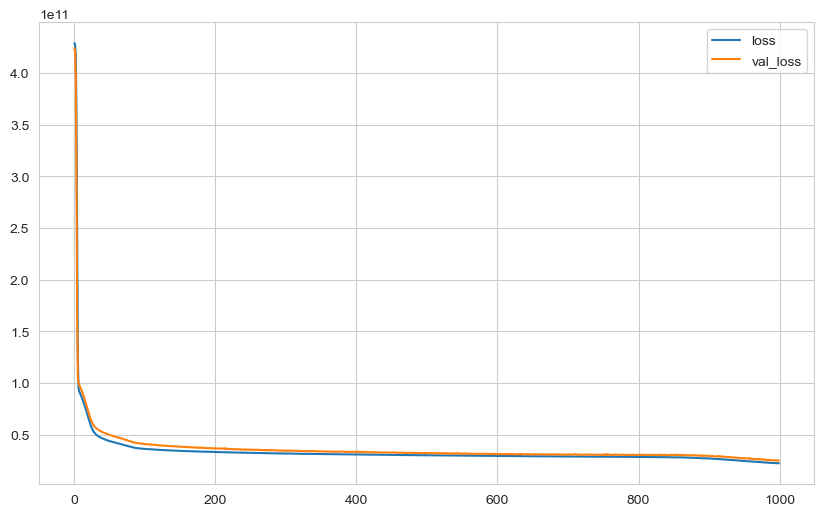

In [150]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [151]:
model.evaluate(X_test, y_test, verbose=0)

20158396416.0

In [152]:
y_pred = model.predict(X_test)

68/68 [==============================] - 9s 2ms/step


In [153]:
eval_metric(y_test, y_pred)

r2_score: 0.8431006305771208 
mae: 85180.51541521991 
mse: 20158393631.53971 
rmse: 141980.25789362306


### learning_rate

In [154]:
from tensorflow.keras.optimizers import Adam

In [155]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(24, activation="relu", input_dim=X_train.shape[1]))
model.add(Dense(24, activation="relu"))
model.add(Dense(12, activation="relu"))
model.add(Dense(6, activation="relu"))
model.add(Dense(1))

opt = Adam(learning_rate=0.003)  # default learning rate value is 0.001
model.compile(optimizer=opt, loss="mse")

In [156]:
model.weights

[<tf.Variable 'dense_5/kernel:0' shape=(16, 24) dtype=float32, numpy=
 array([[ 0.34254378, -0.21737932, -0.19431596, -0.14613885,  0.15849477,
         -0.17244442,  0.14652807,  0.24226749,  0.25701284,  0.14492154,
         -0.11646095, -0.37169018, -0.03266865, -0.34622306, -0.27746603,
          0.12204564,  0.22983962,  0.21624446, -0.00055689,  0.05784327,
          0.21478403,  0.09311247, -0.30773267,  0.30340588],
        [-0.20688543, -0.37086383,  0.03816432, -0.26887202, -0.24505621,
          0.07557052, -0.2547096 , -0.36159483, -0.22923298, -0.04557684,
         -0.24893178,  0.10236651,  0.2434532 ,  0.20476401, -0.12640265,
          0.05677924, -0.00356632,  0.15459168,  0.30721927,  0.29005843,
         -0.171601  , -0.0106141 , -0.13332108, -0.34051713],
        [ 0.35762644, -0.2811224 , -0.20866074,  0.25551444,  0.20974481,
          0.06680921, -0.25338638, -0.00120375, -0.08908075,  0.16823542,
         -0.11766496, -0.31991684, -0.07299012,  0.0143134 , -0.17

In [157]:
model.fit(x=X_train, y=y_train, validation_split=0.15, batch_size=128, epochs=1000)

Epoch 1/1000
130/130 [==============================] - 17s 61ms/step - loss: 428051103744.0000 - val_loss: 419742482432.0000
Epoch 2/1000
130/130 [==============================] - 7s 58ms/step - loss: 357245222912.0000 - val_loss: 205194838016.0000
Epoch 3/1000
130/130 [==============================] - 3s 23ms/step - loss: 113040515072.0000 - val_loss: 100281008128.0000
Epoch 4/1000
130/130 [==============================] - 2s 15ms/step - loss: 91437801472.0000 - val_loss: 96617488384.0000
Epoch 5/1000
130/130 [==============================] - 2s 18ms/step - loss: 87639924736.0000 - val_loss: 92854018048.0000
Epoch 6/1000
130/130 [==============================] - 2s 17ms/step - loss: 83645161472.0000 - val_loss: 88653619200.0000
Epoch 7/1000
130/130 [==============================] - 2s 14ms/step - loss: 79442960384.0000 - val_loss: 84538990592.0000
Epoch 8/1000
130/130 [==============================] - 2s 13ms/step - loss: 74971488256.0000 - val_loss: 79754887168.0000
Epoch 9/1

130/130 [==============================] - 3s 22ms/step - loss: 33595971584.0000 - val_loss: 36847775744.0000
Epoch 68/1000
130/130 [==============================] - 3s 25ms/step - loss: 33406251008.0000 - val_loss: 37032714240.0000
Epoch 69/1000
130/130 [==============================] - 3s 25ms/step - loss: 33418326016.0000 - val_loss: 36794064896.0000
Epoch 70/1000
130/130 [==============================] - 3s 20ms/step - loss: 33339656192.0000 - val_loss: 36605878272.0000
Epoch 71/1000
130/130 [==============================] - 3s 27ms/step - loss: 33443196928.0000 - val_loss: 36957417472.0000
Epoch 72/1000
130/130 [==============================] - 3s 22ms/step - loss: 33238085632.0000 - val_loss: 36413263872.0000
Epoch 73/1000
130/130 [==============================] - 3s 25ms/step - loss: 33193062400.0000 - val_loss: 36387680256.0000
Epoch 74/1000
130/130 [==============================] - 4s 28ms/step - loss: 33153992704.0000 - val_loss: 36345143296.0000
Epoch 75/1000
130/130 

Epoch 133/1000
130/130 [==============================] - 2s 14ms/step - loss: 31464808448.0000 - val_loss: 33829693440.0000
Epoch 134/1000
130/130 [==============================] - 3s 20ms/step - loss: 31458390016.0000 - val_loss: 33814644736.0000
Epoch 135/1000
130/130 [==============================] - 1s 11ms/step - loss: 31397431296.0000 - val_loss: 33778157568.0000
Epoch 136/1000
130/130 [==============================] - 3s 21ms/step - loss: 31324936192.0000 - val_loss: 33647437824.0000
Epoch 137/1000
130/130 [==============================] - 2s 16ms/step - loss: 31297576960.0000 - val_loss: 33712502784.0000
Epoch 138/1000
130/130 [==============================] - 2s 18ms/step - loss: 31246057472.0000 - val_loss: 34290120704.0000
Epoch 139/1000
130/130 [==============================] - 2s 17ms/step - loss: 31321589760.0000 - val_loss: 33797572608.0000
Epoch 140/1000
130/130 [==============================] - 3s 22ms/step - loss: 31197288448.0000 - val_loss: 33763954688.0000


130/130 [==============================] - 1s 11ms/step - loss: 29361901568.0000 - val_loss: 31382585344.0000
Epoch 264/1000
130/130 [==============================] - 2s 13ms/step - loss: 29343051776.0000 - val_loss: 31389077504.0000
Epoch 265/1000
130/130 [==============================] - 1s 11ms/step - loss: 29315479552.0000 - val_loss: 31402262528.0000
Epoch 266/1000
130/130 [==============================] - 2s 17ms/step - loss: 29311494144.0000 - val_loss: 31330854912.0000
Epoch 267/1000
130/130 [==============================] - 3s 23ms/step - loss: 29348825088.0000 - val_loss: 31182182400.0000
Epoch 268/1000
130/130 [==============================] - 2s 12ms/step - loss: 29268725760.0000 - val_loss: 30951114752.0000
Epoch 269/1000
130/130 [==============================] - 2s 18ms/step - loss: 29202356224.0000 - val_loss: 31642560512.0000
Epoch 270/1000
130/130 [==============================] - 2s 14ms/step - loss: 29286375424.0000 - val_loss: 31396470784.0000
Epoch 271/1000


130/130 [==============================] - 2s 14ms/step - loss: 27962456064.0000 - val_loss: 30833395712.0000
Epoch 394/1000
130/130 [==============================] - 2s 13ms/step - loss: 27910889472.0000 - val_loss: 30529015808.0000
Epoch 395/1000
130/130 [==============================] - 2s 12ms/step - loss: 27936387072.0000 - val_loss: 30392551424.0000
Epoch 396/1000
130/130 [==============================] - 2s 14ms/step - loss: 27923030016.0000 - val_loss: 30310807552.0000
Epoch 397/1000
130/130 [==============================] - 2s 16ms/step - loss: 27858673664.0000 - val_loss: 31196975104.0000
Epoch 398/1000
130/130 [==============================] - 2s 16ms/step - loss: 27935770624.0000 - val_loss: 30418272256.0000
Epoch 399/1000
130/130 [==============================] - 2s 14ms/step - loss: 27937667072.0000 - val_loss: 31770130432.0000
Epoch 400/1000
130/130 [==============================] - 2s 14ms/step - loss: 28009408512.0000 - val_loss: 30511194112.0000
Epoch 401/1000


130/130 [==============================] - 2s 18ms/step - loss: 27301496832.0000 - val_loss: 30651424768.0000
Epoch 524/1000
130/130 [==============================] - 2s 14ms/step - loss: 27434784768.0000 - val_loss: 30901071872.0000
Epoch 525/1000
130/130 [==============================] - 1s 10ms/step - loss: 27345809408.0000 - val_loss: 31494004736.0000
Epoch 526/1000
130/130 [==============================] - 2s 12ms/step - loss: 27338858496.0000 - val_loss: 30614274048.0000
Epoch 527/1000
130/130 [==============================] - 1s 11ms/step - loss: 27303976960.0000 - val_loss: 30517293056.0000
Epoch 528/1000
130/130 [==============================] - 1s 11ms/step - loss: 27343781888.0000 - val_loss: 31422578688.0000
Epoch 529/1000
130/130 [==============================] - 2s 17ms/step - loss: 27258185728.0000 - val_loss: 30779332608.0000
Epoch 530/1000
130/130 [==============================] - 3s 21ms/step - loss: 27232753664.0000 - val_loss: 30929573888.0000
Epoch 531/1000


130/130 [==============================] - 2s 14ms/step - loss: 27078526976.0000 - val_loss: 30677856256.0000
Epoch 654/1000
130/130 [==============================] - 2s 15ms/step - loss: 26999324672.0000 - val_loss: 30908061696.0000
Epoch 655/1000
130/130 [==============================] - 1s 12ms/step - loss: 27137437696.0000 - val_loss: 30329303040.0000
Epoch 656/1000
130/130 [==============================] - 2s 13ms/step - loss: 26992285696.0000 - val_loss: 31325663232.0000
Epoch 657/1000
130/130 [==============================] - 2s 12ms/step - loss: 27060166656.0000 - val_loss: 30704883712.0000
Epoch 658/1000
130/130 [==============================] - 2s 13ms/step - loss: 26979450880.0000 - val_loss: 30596368384.0000
Epoch 659/1000
130/130 [==============================] - 2s 13ms/step - loss: 27033118720.0000 - val_loss: 30456328192.0000
Epoch 660/1000
130/130 [==============================] - 1s 11ms/step - loss: 26960705536.0000 - val_loss: 30321661952.0000
Epoch 661/1000


130/130 [==============================] - 3s 23ms/step - loss: 26936709120.0000 - val_loss: 30156802048.0000
Epoch 784/1000
130/130 [==============================] - 2s 16ms/step - loss: 27085649920.0000 - val_loss: 30484381696.0000
Epoch 785/1000
130/130 [==============================] - 2s 14ms/step - loss: 26843789312.0000 - val_loss: 30246377472.0000
Epoch 786/1000
130/130 [==============================] - 2s 16ms/step - loss: 26855223296.0000 - val_loss: 30379358208.0000
Epoch 787/1000
130/130 [==============================] - 1s 10ms/step - loss: 26981173248.0000 - val_loss: 30497359872.0000
Epoch 788/1000
130/130 [==============================] - 1s 11ms/step - loss: 26866565120.0000 - val_loss: 30533496832.0000
Epoch 789/1000
130/130 [==============================] - 2s 19ms/step - loss: 26956736512.0000 - val_loss: 30400487424.0000
Epoch 790/1000
130/130 [==============================] - 2s 18ms/step - loss: 26824286208.0000 - val_loss: 30498177024.0000
Epoch 791/1000


130/130 [==============================] - 1s 10ms/step - loss: 26732961792.0000 - val_loss: 30273159168.0000
Epoch 914/1000
130/130 [==============================] - 2s 16ms/step - loss: 26891620352.0000 - val_loss: 30709790720.0000
Epoch 915/1000
130/130 [==============================] - 2s 18ms/step - loss: 26742665216.0000 - val_loss: 30304536576.0000
Epoch 916/1000
130/130 [==============================] - 2s 15ms/step - loss: 26739922944.0000 - val_loss: 30613938176.0000
Epoch 917/1000
130/130 [==============================] - 3s 24ms/step - loss: 26692491264.0000 - val_loss: 30260430848.0000
Epoch 918/1000
130/130 [==============================] - 3s 23ms/step - loss: 26735769600.0000 - val_loss: 30248325120.0000
Epoch 919/1000
130/130 [==============================] - 3s 26ms/step - loss: 26687365120.0000 - val_loss: 30554869760.0000
Epoch 920/1000
130/130 [==============================] - 2s 16ms/step - loss: 26803230720.0000 - val_loss: 30628642816.0000
Epoch 921/1000


<Axes: >

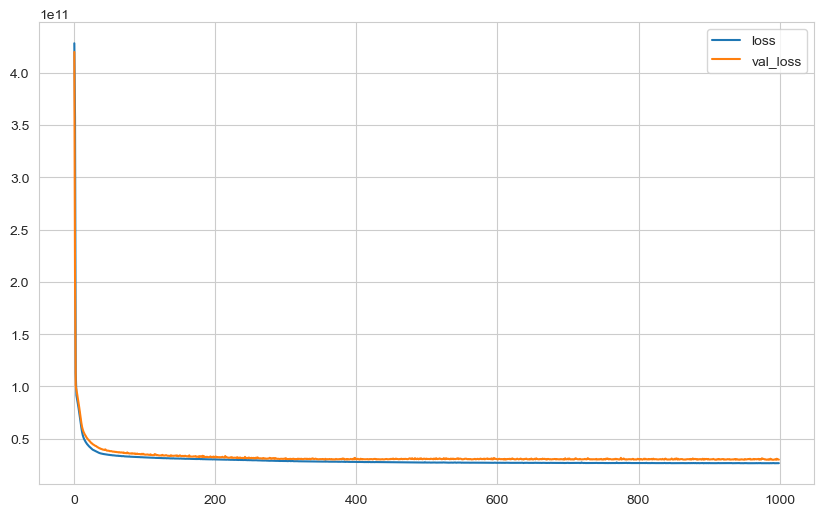

In [158]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [159]:
y_pred = model.predict(X_test)

68/68 [==============================] - 8s 5ms/step


In [160]:
eval_metric(y_test, y_pred)

r2_score: 0.8151049362383944 
mae: 95618.89735966435 
mse: 23755273775.444366 
rmse: 154127.45951141985


### EarlyStopping

In [161]:
from tensorflow.keras.callbacks import EarlyStopping

In [162]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(24, activation="relu", input_dim=X_train.shape[1]))
model.add(Dense(24, activation="relu"))
model.add(Dense(12, activation="relu"))
model.add(Dense(6, activation="relu"))
model.add(Dense(1))

opt = Adam(learning_rate=0.003)
model.compile(optimizer=opt, loss="mse")

In [163]:
early_stop = EarlyStopping(
    monitor="val_loss", mode="min", verbose=1, patience=25, restore_best_weights=True
)

In [164]:
model.fit(
    x=X_train,
    y=y_train,
    validation_split=0.15,
    batch_size=128,
    epochs=1000,
    callbacks=[early_stop],
)

Epoch 1/1000
130/130 [==============================] - 15s 61ms/step - loss: 427793448960.0000 - val_loss: 418182365184.0000
Epoch 2/1000
130/130 [==============================] - 7s 51ms/step - loss: 347730706432.0000 - val_loss: 188873424896.0000
Epoch 3/1000
130/130 [==============================] - 2s 16ms/step - loss: 108038832128.0000 - val_loss: 99091308544.0000
Epoch 4/1000
130/130 [==============================] - 2s 16ms/step - loss: 90185252864.0000 - val_loss: 95364128768.0000
Epoch 5/1000
130/130 [==============================] - 2s 12ms/step - loss: 86300131328.0000 - val_loss: 91483234304.0000
Epoch 6/1000
130/130 [==============================] - 1s 11ms/step - loss: 82166726656.0000 - val_loss: 87115284480.0000
Epoch 7/1000
130/130 [==============================] - 2s 15ms/step - loss: 77767630848.0000 - val_loss: 82760089600.0000
Epoch 8/1000
130/130 [==============================] - 2s 14ms/step - loss: 73053175808.0000 - val_loss: 77722574848.0000
Epoch 9/10

130/130 [==============================] - 2s 19ms/step - loss: 33354080256.0000 - val_loss: 36489445376.0000
Epoch 68/1000
130/130 [==============================] - 2s 17ms/step - loss: 33165340672.0000 - val_loss: 36691845120.0000
Epoch 69/1000
130/130 [==============================] - 2s 16ms/step - loss: 33182588928.0000 - val_loss: 36462129152.0000
Epoch 70/1000
130/130 [==============================] - 3s 21ms/step - loss: 33109274624.0000 - val_loss: 36282433536.0000
Epoch 71/1000
130/130 [==============================] - 3s 24ms/step - loss: 33224249344.0000 - val_loss: 36645793792.0000
Epoch 72/1000
130/130 [==============================] - 2s 17ms/step - loss: 33028198400.0000 - val_loss: 36119580672.0000
Epoch 73/1000
130/130 [==============================] - 2s 18ms/step - loss: 32996188160.0000 - val_loss: 36103393280.0000
Epoch 74/1000
130/130 [==============================] - 3s 21ms/step - loss: 32966639616.0000 - val_loss: 36085391360.0000
Epoch 75/1000
130/130 

Epoch 133/1000
130/130 [==============================] - 2s 19ms/step - loss: 31429789696.0000 - val_loss: 33798148096.0000
Epoch 134/1000
130/130 [==============================] - 2s 19ms/step - loss: 31421802496.0000 - val_loss: 33804812288.0000
Epoch 135/1000
130/130 [==============================] - 2s 17ms/step - loss: 31375613952.0000 - val_loss: 33723781120.0000
Epoch 136/1000
130/130 [==============================] - 2s 19ms/step - loss: 31286183936.0000 - val_loss: 33601079296.0000
Epoch 137/1000
130/130 [==============================] - 2s 16ms/step - loss: 31266365440.0000 - val_loss: 33682436096.0000
Epoch 138/1000
130/130 [==============================] - 2s 15ms/step - loss: 31215077376.0000 - val_loss: 34245548032.0000
Epoch 139/1000
130/130 [==============================] - 2s 15ms/step - loss: 31292000256.0000 - val_loss: 33748221952.0000
Epoch 140/1000
130/130 [==============================] - 2s 16ms/step - loss: 31176357888.0000 - val_loss: 33734244352.0000


130/130 [==============================] - 3s 23ms/step - loss: 28703209472.0000 - val_loss: 31206309888.0000
Epoch 264/1000
130/130 [==============================] - 3s 26ms/step - loss: 28691087360.0000 - val_loss: 31254896640.0000
Epoch 265/1000
130/130 [==============================] - 2s 16ms/step - loss: 28671617024.0000 - val_loss: 31258740736.0000
Epoch 266/1000
130/130 [==============================] - 2s 18ms/step - loss: 28662867968.0000 - val_loss: 31201847296.0000
Epoch 267/1000
130/130 [==============================] - 3s 21ms/step - loss: 28694882304.0000 - val_loss: 31076403200.0000
Epoch 268/1000
130/130 [==============================] - 3s 23ms/step - loss: 28635600896.0000 - val_loss: 30869760000.0000
Epoch 269/1000
130/130 [==============================] - 3s 20ms/step - loss: 28574099456.0000 - val_loss: 31640584192.0000
Epoch 270/1000
130/130 [==============================] - 2s 19ms/step - loss: 28658952192.0000 - val_loss: 31393185792.0000
Epoch 271/1000


130/130 [==============================] - 3s 24ms/step - loss: 27532140544.0000 - val_loss: 30926438400.0000
Epoch 394/1000
130/130 [==============================] - 3s 24ms/step - loss: 27470639104.0000 - val_loss: 30703343616.0000
Epoch 395/1000
130/130 [==============================] - 3s 24ms/step - loss: 27506366464.0000 - val_loss: 30507241472.0000
Epoch 396/1000
130/130 [==============================] - 3s 26ms/step - loss: 27499704320.0000 - val_loss: 30450753536.0000
Epoch 396: early stopping


<Axes: >

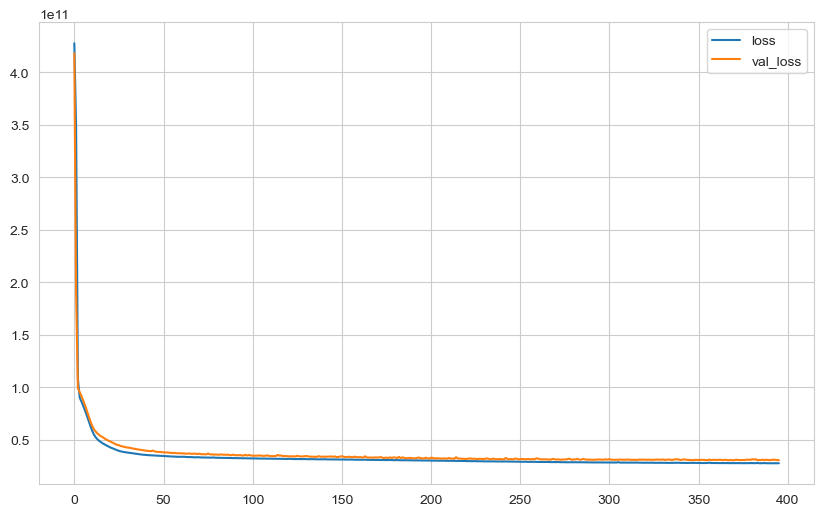

In [165]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [166]:
y_pred = model.predict(X_test)

68/68 [==============================] - 8s 2ms/step


In [167]:
eval_metric(y_test, y_pred)

r2_score: 0.8077635896720201 
mae: 97162.05286458334 
mse: 24698488234.590214 
rmse: 157157.5268149452


### Dropout

The Dropout layer randomly sets input units to 0 with a frequency of `rate`
at each step during training time, which helps prevent overfitting.

Dropout refers to ignoring units (i.e. neurons) during the training phase of certain set of neurons which is chosen at random. By “ignoring”, I mean these units are not considered during a particular forward or backward pass.

For each hidden layer, for each training sample, for each iteration, ignore (zero out) a random fraction, p, of nodes (and corresponding activations).

![dropout.PNG](https://miro.medium.com/max/1400/1*nty4xtm9UBuWLqxHVaamjw.png)
[Source-1](https://medium.com/@amarbudhiraja/https-medium-com-amarbudhiraja-learning-less-to-learn-better-dropout-in-deep-machine-learning-74334da4bfc5)
[Source-2](https://medium.com/unpackai/introduction-of-dropout-and-ensemble-model-in-the-history-of-deep-learning-a4c2a512dcca)

In [168]:
from tensorflow.keras.layers import Dropout

In [169]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(24, activation="relu", input_dim=X_train.shape[1]))
model.add(Dropout(0.2))
model.add(Dense(24, activation="relu"))
model.add(Dropout(0.2))
model.add(Dense(12, activation="relu"))
model.add(Dropout(0.2))
model.add(Dense(6, activation="relu"))
model.add(Dropout(0.2))
model.add(Dense(1))

opt = Adam(learning_rate=0.003)
model.compile(optimizer=opt, loss="mse")

In [170]:
early_stop = EarlyStopping(
    monitor="val_loss", mode="min", verbose=1, patience=25, restore_best_weights=True
)

In [171]:
model.fit(
    x=X_train,
    y=y_train,
    validation_split=0.15,
    batch_size=128,
    epochs=1000,
    callbacks=[early_stop],
)

Epoch 1/1000
130/130 [==============================] - 15s 54ms/step - loss: 428333432832.0000 - val_loss: 421930172416.0000
Epoch 2/1000
130/130 [==============================] - 6s 50ms/step - loss: 372720271360.0000 - val_loss: 219816411136.0000
Epoch 3/1000
130/130 [==============================] - 3s 20ms/step - loss: 156439265280.0000 - val_loss: 104656134144.0000
Epoch 4/1000
130/130 [==============================] - 2s 17ms/step - loss: 136721047552.0000 - val_loss: 99389030400.0000
Epoch 5/1000
130/130 [==============================] - 3s 22ms/step - loss: 130326183936.0000 - val_loss: 94452703232.0000
Epoch 6/1000
130/130 [==============================] - 2s 19ms/step - loss: 125393461248.0000 - val_loss: 91061272576.0000
Epoch 7/1000
130/130 [==============================] - 2s 17ms/step - loss: 120331591680.0000 - val_loss: 83976404992.0000
Epoch 8/1000
130/130 [==============================] - 3s 22ms/step - loss: 112454025216.0000 - val_loss: 77881835520.0000
Epoc

130/130 [==============================] - 3s 22ms/step - loss: 74038738944.0000 - val_loss: 41508179968.0000
Epoch 68/1000
130/130 [==============================] - 3s 21ms/step - loss: 74026532864.0000 - val_loss: 40178409472.0000
Epoch 69/1000
130/130 [==============================] - 3s 20ms/step - loss: 74307526656.0000 - val_loss: 41376669696.0000
Epoch 70/1000
130/130 [==============================] - 3s 21ms/step - loss: 76488122368.0000 - val_loss: 40845860864.0000
Epoch 71/1000
130/130 [==============================] - 3s 21ms/step - loss: 73470271488.0000 - val_loss: 39791546368.0000
Epoch 72/1000
130/130 [==============================] - 3s 20ms/step - loss: 72327503872.0000 - val_loss: 41245822976.0000
Epoch 73/1000
130/130 [==============================] - 3s 21ms/step - loss: 74635485184.0000 - val_loss: 40157556736.0000
Epoch 74/1000
130/130 [==============================] - 3s 25ms/step - loss: 74838188032.0000 - val_loss: 41450995712.0000
Epoch 75/1000
130/130 

Epoch 133/1000
130/130 [==============================] - 2s 19ms/step - loss: 74745044992.0000 - val_loss: 39029739520.0000
Epoch 134/1000
130/130 [==============================] - 2s 16ms/step - loss: 74427949056.0000 - val_loss: 38456578048.0000
Epoch 135/1000
130/130 [==============================] - 2s 18ms/step - loss: 72832049152.0000 - val_loss: 36976107520.0000
Epoch 136/1000
130/130 [==============================] - 3s 20ms/step - loss: 73207496704.0000 - val_loss: 38366912512.0000
Epoch 137/1000
130/130 [==============================] - 2s 13ms/step - loss: 70256394240.0000 - val_loss: 37291229184.0000
Epoch 138/1000
130/130 [==============================] - 2s 18ms/step - loss: 72131551232.0000 - val_loss: 36172115968.0000
Epoch 139/1000
130/130 [==============================] - 3s 22ms/step - loss: 70233833472.0000 - val_loss: 35882680320.0000
Epoch 140/1000
130/130 [==============================] - 3s 23ms/step - loss: 72431263744.0000 - val_loss: 41274859520.0000


<Axes: >

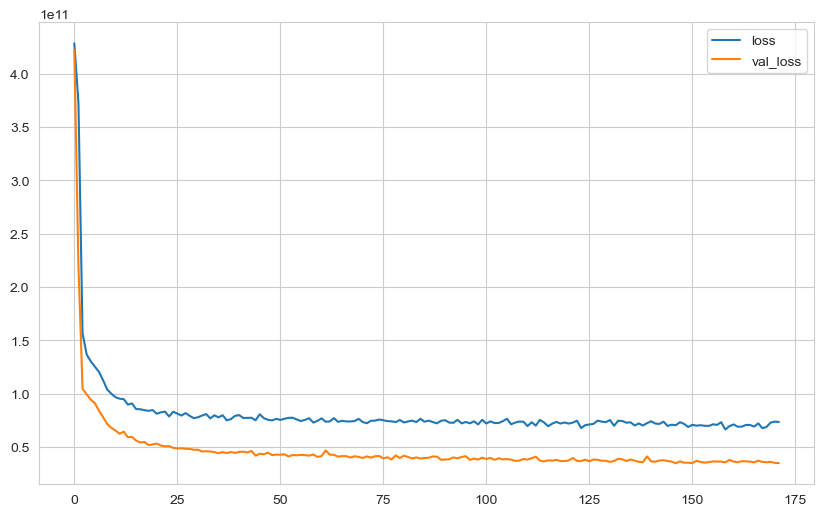

In [172]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [173]:
y_pred = model.predict(X_test)

68/68 [==============================] - 7s 1ms/step


In [174]:
eval_metric(y_test, y_pred)

r2_score: 0.7747182010068885 
mae: 105284.08629918982 
mse: 28944151903.40675 
rmse: 170129.80897951644


## Saving Final Model and Scaler

In [175]:
import pickle

pickle.dump(scaler, open("scaler_kc_house", "wb"))

In [176]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(24, activation="relu", input_dim=X_train.shape[1]))
model.add(Dense(24, activation="relu"))
model.add(Dense(12, activation="relu"))
model.add(Dense(6, activation="relu"))
model.add(Dense(1))

opt = Adam(learning_rate=0.003)
model.compile(optimizer=opt, loss="mse")

In [177]:
early_stop = EarlyStopping(
    monitor="val_loss", mode="min", verbose=1, patience=100, restore_best_weights=True
)

In [178]:
model.fit(
    x=X_train,
    y=y_train,
    validation_data=(X_test, y_test),
    batch_size=128,
    epochs=1500,
    callbacks=[early_stop],
)

Epoch 1/1500
152/152 [==============================] - 11s 38ms/step - loss: 427192942592.0000 - val_loss: 411846836224.0000
Epoch 2/1500
152/152 [==============================] - 5s 33ms/step - loss: 334997159936.0000 - val_loss: 155905687552.0000
Epoch 3/1500
152/152 [==============================] - 3s 19ms/step - loss: 102861299712.0000 - val_loss: 86886187008.0000
Epoch 4/1500
152/152 [==============================] - 3s 22ms/step - loss: 91374632960.0000 - val_loss: 83144679424.0000
Epoch 5/1500
152/152 [==============================] - 3s 17ms/step - loss: 87484702720.0000 - val_loss: 79129010176.0000
Epoch 6/1500
152/152 [==============================] - 4s 24ms/step - loss: 83395477504.0000 - val_loss: 75035500544.0000
Epoch 7/1500
152/152 [==============================] - 3s 18ms/step - loss: 78946795520.0000 - val_loss: 70470205440.0000
Epoch 8/1500
152/152 [==============================] - 3s 18ms/step - loss: 74078568448.0000 - val_loss: 65736589312.0000
Epoch 9/15

152/152 [==============================] - 2s 12ms/step - loss: 33118736384.0000 - val_loss: 28828512256.0000
Epoch 68/1500
152/152 [==============================] - 3s 17ms/step - loss: 33120061440.0000 - val_loss: 28746950656.0000
Epoch 69/1500
152/152 [==============================] - 3s 19ms/step - loss: 32994074624.0000 - val_loss: 28770285568.0000
Epoch 70/1500
152/152 [==============================] - 2s 16ms/step - loss: 32936237056.0000 - val_loss: 28669392896.0000
Epoch 71/1500
152/152 [==============================] - 3s 19ms/step - loss: 32950804480.0000 - val_loss: 28607760384.0000
Epoch 72/1500
152/152 [==============================] - 3s 19ms/step - loss: 32833626112.0000 - val_loss: 28669718528.0000
Epoch 73/1500
152/152 [==============================] - 3s 17ms/step - loss: 32904634368.0000 - val_loss: 28697020416.0000
Epoch 74/1500
152/152 [==============================] - 2s 16ms/step - loss: 32874786816.0000 - val_loss: 28518330368.0000
Epoch 75/1500
152/152 

Epoch 133/1500
152/152 [==============================] - 2s 16ms/step - loss: 31100735488.0000 - val_loss: 26814466048.0000
Epoch 134/1500
152/152 [==============================] - 2s 14ms/step - loss: 30994755584.0000 - val_loss: 26868101120.0000
Epoch 135/1500
152/152 [==============================] - 2s 14ms/step - loss: 31130261504.0000 - val_loss: 26828726272.0000
Epoch 136/1500
152/152 [==============================] - 3s 17ms/step - loss: 30922280960.0000 - val_loss: 26863517696.0000
Epoch 137/1500
152/152 [==============================] - 3s 18ms/step - loss: 31029942272.0000 - val_loss: 26716594176.0000
Epoch 138/1500
152/152 [==============================] - 3s 18ms/step - loss: 30921109504.0000 - val_loss: 26718324736.0000
Epoch 139/1500
152/152 [==============================] - 2s 12ms/step - loss: 30842136576.0000 - val_loss: 26646038528.0000
Epoch 140/1500
152/152 [==============================] - 3s 23ms/step - loss: 30858022912.0000 - val_loss: 26628263936.0000


152/152 [==============================] - 2s 16ms/step - loss: 28388257792.0000 - val_loss: 24811081728.0000
Epoch 264/1500
152/152 [==============================] - 2s 16ms/step - loss: 28478724096.0000 - val_loss: 24804280320.0000
Epoch 265/1500
152/152 [==============================] - 3s 18ms/step - loss: 28380778496.0000 - val_loss: 24768569344.0000
Epoch 266/1500
152/152 [==============================] - 4s 24ms/step - loss: 28375343104.0000 - val_loss: 24847736832.0000
Epoch 267/1500
152/152 [==============================] - 3s 17ms/step - loss: 28406667264.0000 - val_loss: 24856829952.0000
Epoch 268/1500
152/152 [==============================] - 3s 19ms/step - loss: 28422389760.0000 - val_loss: 24802850816.0000
Epoch 269/1500
152/152 [==============================] - 2s 10ms/step - loss: 28490225664.0000 - val_loss: 24774602752.0000
Epoch 270/1500
152/152 [==============================] - 2s 15ms/step - loss: 28362020864.0000 - val_loss: 24795478016.0000
Epoch 271/1500


152/152 [==============================] - 2s 15ms/step - loss: 27376582656.0000 - val_loss: 23782881280.0000
Epoch 394/1500
152/152 [==============================] - 3s 17ms/step - loss: 27408384000.0000 - val_loss: 23800780800.0000
Epoch 395/1500
152/152 [==============================] - 2s 15ms/step - loss: 27395020800.0000 - val_loss: 23666071552.0000
Epoch 396/1500
152/152 [==============================] - 2s 14ms/step - loss: 27412918272.0000 - val_loss: 23679074304.0000
Epoch 397/1500
152/152 [==============================] - 2s 14ms/step - loss: 27449155584.0000 - val_loss: 23739080704.0000
Epoch 398/1500
152/152 [==============================] - 3s 18ms/step - loss: 27381886976.0000 - val_loss: 23702771712.0000
Epoch 399/1500
152/152 [==============================] - 2s 13ms/step - loss: 27388241920.0000 - val_loss: 23650742272.0000
Epoch 400/1500
152/152 [==============================] - 2s 16ms/step - loss: 27315335168.0000 - val_loss: 23637118976.0000
Epoch 401/1500


152/152 [==============================] - 2s 13ms/step - loss: 26844178432.0000 - val_loss: 23108853760.0000
Epoch 524/1500
152/152 [==============================] - 2s 12ms/step - loss: 26908426240.0000 - val_loss: 23148036096.0000
Epoch 525/1500
152/152 [==============================] - 2s 10ms/step - loss: 26851540992.0000 - val_loss: 23126839296.0000
Epoch 526/1500
152/152 [==============================] - 2s 15ms/step - loss: 26872690688.0000 - val_loss: 23130105856.0000
Epoch 527/1500
152/152 [==============================] - 2s 15ms/step - loss: 26855704576.0000 - val_loss: 23227430912.0000
Epoch 528/1500
152/152 [==============================] - 3s 17ms/step - loss: 26799724544.0000 - val_loss: 23091849216.0000
Epoch 529/1500
152/152 [==============================] - 2s 11ms/step - loss: 26831650816.0000 - val_loss: 23125463040.0000
Epoch 530/1500
152/152 [==============================] - 2s 13ms/step - loss: 26839967744.0000 - val_loss: 23182401536.0000
Epoch 531/1500


152/152 [==============================] - 2s 10ms/step - loss: 19929174016.0000 - val_loss: 17774149632.0000
Epoch 654/1500
152/152 [==============================] - 2s 15ms/step - loss: 19816597504.0000 - val_loss: 17480996864.0000
Epoch 655/1500
152/152 [==============================] - 2s 11ms/step - loss: 19808411648.0000 - val_loss: 17447520256.0000
Epoch 656/1500
152/152 [==============================] - 2s 10ms/step - loss: 19741435904.0000 - val_loss: 17418409984.0000
Epoch 657/1500
152/152 [==============================] - 1s 10ms/step - loss: 19706644480.0000 - val_loss: 17419991040.0000
Epoch 658/1500
152/152 [==============================] - 2s 14ms/step - loss: 19731830784.0000 - val_loss: 18521798656.0000
Epoch 659/1500
152/152 [==============================] - 2s 12ms/step - loss: 19684943872.0000 - val_loss: 17482299392.0000
Epoch 660/1500
152/152 [==============================] - 2s 11ms/step - loss: 19675238400.0000 - val_loss: 17354471424.0000
Epoch 661/1500


152/152 [==============================] - 1s 10ms/step - loss: 17530261504.0000 - val_loss: 16213095424.0000
Epoch 784/1500
152/152 [==============================] - 2s 13ms/step - loss: 17511274496.0000 - val_loss: 16045518848.0000
Epoch 785/1500
152/152 [==============================] - 2s 16ms/step - loss: 17506111488.0000 - val_loss: 16041743360.0000
Epoch 786/1500
152/152 [==============================] - 2s 12ms/step - loss: 17404704768.0000 - val_loss: 15971920896.0000
Epoch 787/1500
152/152 [==============================] - 2s 11ms/step - loss: 17454737408.0000 - val_loss: 15848502272.0000
Epoch 788/1500
152/152 [==============================] - 2s 16ms/step - loss: 17363798016.0000 - val_loss: 16009099264.0000
Epoch 789/1500
152/152 [==============================] - 2s 15ms/step - loss: 17360453632.0000 - val_loss: 15987090432.0000
Epoch 790/1500
152/152 [==============================] - 2s 14ms/step - loss: 17473433600.0000 - val_loss: 15888132096.0000
Epoch 791/1500


152/152 [==============================] - 3s 17ms/step - loss: 14619707392.0000 - val_loss: 13956942848.0000
Epoch 914/1500
152/152 [==============================] - 3s 17ms/step - loss: 14539415552.0000 - val_loss: 14172651520.0000
Epoch 915/1500
152/152 [==============================] - 3s 17ms/step - loss: 14464475136.0000 - val_loss: 13501670400.0000
Epoch 916/1500
152/152 [==============================] - 2s 13ms/step - loss: 14439595008.0000 - val_loss: 14176709632.0000
Epoch 917/1500
152/152 [==============================] - 2s 14ms/step - loss: 14514413568.0000 - val_loss: 13680485376.0000
Epoch 918/1500
152/152 [==============================] - 3s 23ms/step - loss: 14601956352.0000 - val_loss: 13674243072.0000
Epoch 919/1500
152/152 [==============================] - 1s 10ms/step - loss: 14435558400.0000 - val_loss: 14034536448.0000
Epoch 920/1500
152/152 [==============================] - 3s 17ms/step - loss: 14510401536.0000 - val_loss: 13643409408.0000
Epoch 921/1500


152/152 [==============================] - 2s 15ms/step - loss: 12522370048.0000 - val_loss: 12904498176.0000
Epoch 1044/1500
152/152 [==============================] - 2s 16ms/step - loss: 12643385344.0000 - val_loss: 13076666368.0000
Epoch 1045/1500
152/152 [==============================] - 2s 10ms/step - loss: 12530357248.0000 - val_loss: 13049570304.0000
Epoch 1046/1500
152/152 [==============================] - 2s 14ms/step - loss: 12614734848.0000 - val_loss: 13104297984.0000
Epoch 1047/1500
152/152 [==============================] - 2s 13ms/step - loss: 12548623360.0000 - val_loss: 13137343488.0000
Epoch 1048/1500
152/152 [==============================] - 2s 14ms/step - loss: 12511175680.0000 - val_loss: 12987320320.0000
Epoch 1049/1500
152/152 [==============================] - 2s 11ms/step - loss: 12597486592.0000 - val_loss: 13085895680.0000
Epoch 1050/1500
152/152 [==============================] - 2s 11ms/step - loss: 12545564672.0000 - val_loss: 12902491136.0000
Epoch 10

<Axes: >

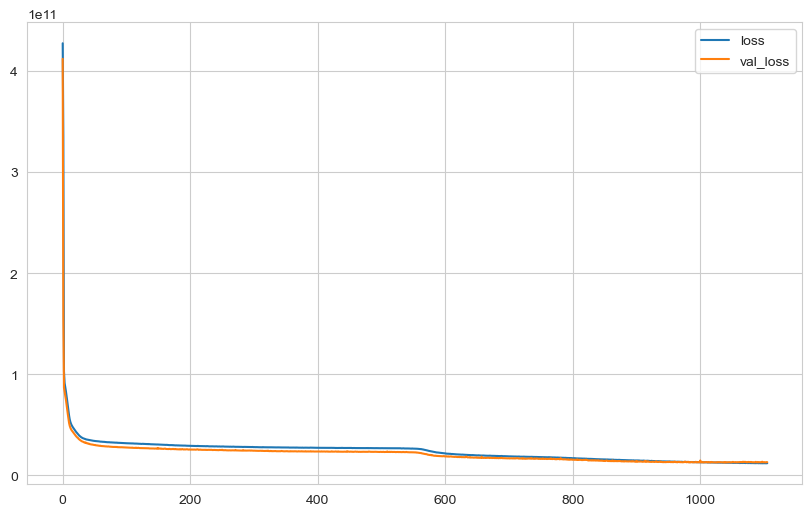

In [179]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [180]:
y_pred = model.predict(X_test)

68/68 [==============================] - 6s 1ms/step


In [181]:
eval_metric(y_test, y_pred)

r2_score: 0.9002986932947261 
mae: 69566.84308268229 
mse: 12809600150.31588 
rmse: 113179.50410880885


In [182]:
model.save("model_kc_house.h5")  # creates a HDF5 file 'my_model.h5'

## Loading Model and Scaler

In [183]:
from tensorflow.keras.models import load_model

In [184]:
model_kc_house = load_model("model_kc_house.h5")
scaler_kc_house = pickle.load(open("scaler_kc_house", "rb"))

## Prediction

In [185]:
single_house = df.drop("price", axis=1).iloc[[0], :]
single_house

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
0,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,47.511,-122.257,1340,5650,1955.000


In [186]:
single_house = scaler_kc_house.transform(single_house)
single_house

array([[0.2       , 0.06666667, 0.06150342, 0.00307611, 0.        ,
        0.        , 0.        , 0.5       , 0.4       , 0.08960177,
        0.        , 0.57149751, 0.21760797, 0.15304348, 0.00573322,
        0.47826087]])

In [187]:
model_kc_house.predict(single_house)

1/1 [==============================] - 7s 7s/step


array([[225019.94]], dtype=float32)

In [188]:
df.iloc[0][0]

221900.0

## Comparison with ML

### Linear Regression

In [189]:
from sklearn.linear_model import LinearRegression

In [190]:
ln_model = LinearRegression()
ln_model.fit(X_train, y_train)
y_pred = ln_model.predict(X_test)
eval_metric(y_test, y_pred)

r2_score: 0.7054431219005433 
mae: 124715.1481019047 
mse: 37844597575.166885 
rmse: 194536.87973021177


### Random Forest

In [191]:
from sklearn.ensemble import RandomForestRegressor

In [192]:
rf_model = RandomForestRegressor(random_state=seed)
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)
eval_metric(y_test, y_pred)

r2_score: 0.8912532816836695 
mae: 64653.2709236993 
mse: 13971752480.727938 
rmse: 118202.16783429963


___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___